In [10]:
import numpy as np
import pandas as pd
import random
from chemevo import evolution_V1 as evo
import itertools
import os
import matplotlib.pyplot as plt
from chemevo import iterative_1D_method_no_mask as iterative_1D_method

from matplotlib import rcParams

params = {
   'axes.labelsize': 20,
   'font.size': 15,
   'legend.fontsize': 14,
   'xtick.minor.visible': True,
   'ytick.minor.visible': True,
   'xtick.labelsize': 15,
   'ytick.labelsize': 15,
   'text.usetex': True, #to use TeX in your labels
   'font.family':'serif',
   'axes.titlesize': 20,
   'xtick.direction': 'in',
   'ytick.direction': 'in',
   'xtick.top': True,
   'ytick.right': True,
   'xtick.major.size': 6,
   'xtick.minor.size': 3,
   'ytick.major.size': 6,
   'ytick.minor.size': 3
   }
rcParams.update(params)

fe_mg_bin_edges = np.arange(-0.35, 0.15, 0.1)
fe_mg_centers = 0.5 * (fe_mg_bin_edges[:-1] + fe_mg_bin_edges[1:])

In [102]:
data = pd.read_csv("data_lines_with_vals.csv")

In [31]:
# Default init values
alpha_cc_def = 0.4
alpha_Ia_def = 0.3
g_cc_def = 0.4
g_ratio_def = 1.8

In [30]:
alpha_cc_inits = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
alpha_Ia_inits = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
g_cc_inits = np.linspace(0.1, 1, 10)
g_ratio_inits = [1, 1.3, 1.5, 1.7, 1.9, 2.1, 2.3, 2.5, 2.7, 2.9]

In [5]:
best_results_alpha_cc = []

# Loop for alpha_cc variations
for val in alpha_cc_inits:
    output_dir = f"models_no_mask/alpha_cc_init_{val}/"
    os.makedirs(output_dir, exist_ok=True)
    
    iterative_1D_method.iterative_1D_loop(
        data_path="data_lines_with_vals.csv", 
        output_path=output_dir,
        n_iters=10, grid_size=0.1, grid_len=5, 
        alpha_cc_init=val, 
        alpha_Ia_init=alpha_Ia_def, 
        g_cc_init=g_cc_def, 
        g_ratio_init=g_ratio_def
    )
    
    # Read the results and extract the last row
    df_res = pd.read_csv(os.path.join(output_dir, "best_parameters_per_iteration.csv"))
    last_row = df_res.iloc[-1].copy()
    last_row['init_val_tested'] = val
    
    best_results_alpha_cc.append(last_row)

df_best_alpha_cc = pd.DataFrame(best_results_alpha_cc)

alpha_ccs =  [0.1 0.2 0.3]
n_gals in each alpha_cc =  300
n_gals total =  900
Done generating models for alpha_cc, iter = 0, grid size = 0.1, grid_len = 5
Done generating models for alpha_cc, iter = 0, grid size = 0.1, grid_len = 5
Done generating models for alpha_cc, iter = 0, grid size = 0.1, grid_len = 5
iter = 0
best alpha_cc = 0.3
alpha_Ias =  [0.1 0.2 0.3 0.4 0.5]
n_gals in each alpha_Ia =  300
n_gals total =  1500
Done generating models for alpha_Ia, iter = 0, grid size = 0.1, grid_len = 5
Done generating models for alpha_Ia, iter = 0, grid size = 0.1, grid_len = 5
Done generating models for alpha_Ia, iter = 0, grid size = 0.1, grid_len = 5
Done generating models for alpha_Ia, iter = 0, grid size = 0.1, grid_len = 5
Done generating models for alpha_Ia, iter = 0, grid size = 0.1, grid_len = 5
iter = 0
best alpha_Ia = 0.5
g_ccs =  [0.2 0.3 0.4 0.5 0.6]
n_gals in each g_cc =  300
n_gals total =  1500
Done generating models for g_cc, iter = 0, grid size = 0.1, grid_len = 5
Done gene

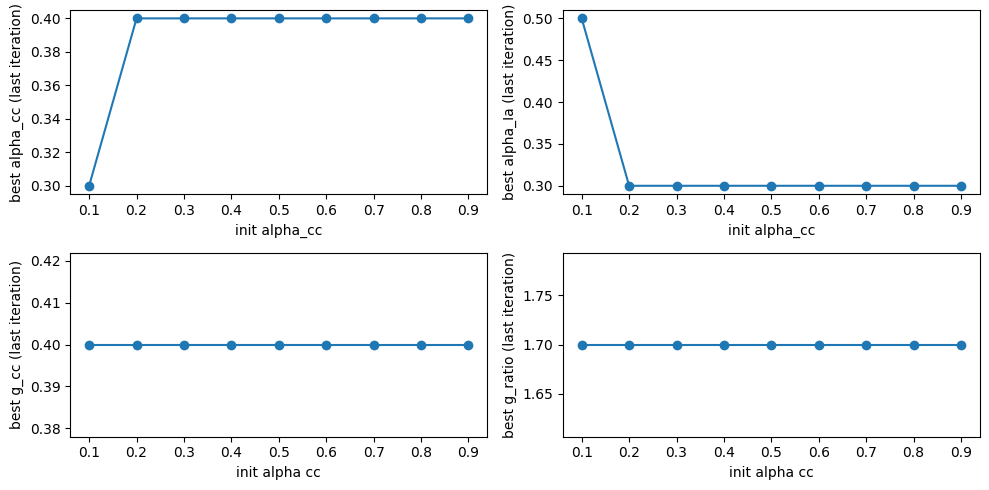

In [6]:
plt.figure(figsize=(10,5))

plt.subplot(2,2,1)
plt.plot(df_best_alpha_cc['init_val_tested'], df_best_alpha_cc['best_alpha_cc'], marker='o')
plt.xlabel("init alpha_cc")
plt.ylabel("best alpha_cc (last iteration)")

plt.subplot(2,2,2)
plt.plot(df_best_alpha_cc['init_val_tested'], df_best_alpha_cc['best_alpha_Ia'], marker='o')
plt.xlabel("init alpha_cc")
plt.ylabel("best alpha_Ia (last iteration)")

plt.subplot(2,2,3)
plt.plot(df_best_alpha_cc['init_val_tested'], df_best_alpha_cc['best_g_cc'], marker='o')
plt.xlabel("init alpha cc")
plt.ylabel("best g_cc (last iteration)")

plt.subplot(2,2,4)
plt.plot(df_best_alpha_cc['init_val_tested'], df_best_alpha_cc['best_g_ratio'], marker='o')
plt.xlabel("init alpha cc")
plt.ylabel("best g_ratio (last iteration)")


plt.tight_layout()

In [7]:
best_results_alpha_Ia = []

for val in alpha_Ia_inits:
    output_dir = f"models_no_mask/alpha_Ia_init_{val}/"
    os.makedirs(output_dir, exist_ok=True)
    
    iterative_1D_method.iterative_1D_loop(
        data_path="data_lines_with_vals.csv", 
        output_path=output_dir,
        n_iters=10, grid_size=0.1, grid_len=5, 
        alpha_cc_init=alpha_cc_def, 
        alpha_Ia_init=val, 
        g_cc_init=g_cc_def, 
        g_ratio_init=g_ratio_def
    )
    
    # Read the results and extract the last row
    df_res = pd.read_csv(os.path.join(output_dir, "best_parameters_per_iteration.csv"))
    last_row = df_res.iloc[-1].copy()
    last_row['init_val_tested'] = val
    
    best_results_alpha_Ia.append(last_row)

df_best_alpha_Ia = pd.DataFrame(best_results_alpha_Ia)

alpha_ccs =  [0.2 0.3 0.4 0.5 0.6]
n_gals in each alpha_cc =  300
n_gals total =  1500
Done generating models for alpha_cc, iter = 0, grid size = 0.1, grid_len = 5
Done generating models for alpha_cc, iter = 0, grid size = 0.1, grid_len = 5
Done generating models for alpha_cc, iter = 0, grid size = 0.1, grid_len = 5
Done generating models for alpha_cc, iter = 0, grid size = 0.1, grid_len = 5
Done generating models for alpha_cc, iter = 0, grid size = 0.1, grid_len = 5
iter = 0
best alpha_cc = 0.5
alpha_Ias =  [0.1 0.2 0.3]
n_gals in each alpha_Ia =  300
n_gals total =  1500
Done generating models for alpha_Ia, iter = 0, grid size = 0.1, grid_len = 5
Done generating models for alpha_Ia, iter = 0, grid size = 0.1, grid_len = 5
Done generating models for alpha_Ia, iter = 0, grid size = 0.1, grid_len = 5
iter = 0
best alpha_Ia = 0.2
g_ccs =  [0.2 0.3 0.4 0.5 0.6]
n_gals in each g_cc =  300
n_gals total =  1500
Done generating models for g_cc, iter = 0, grid size = 0.1, grid_len = 5
Done gen

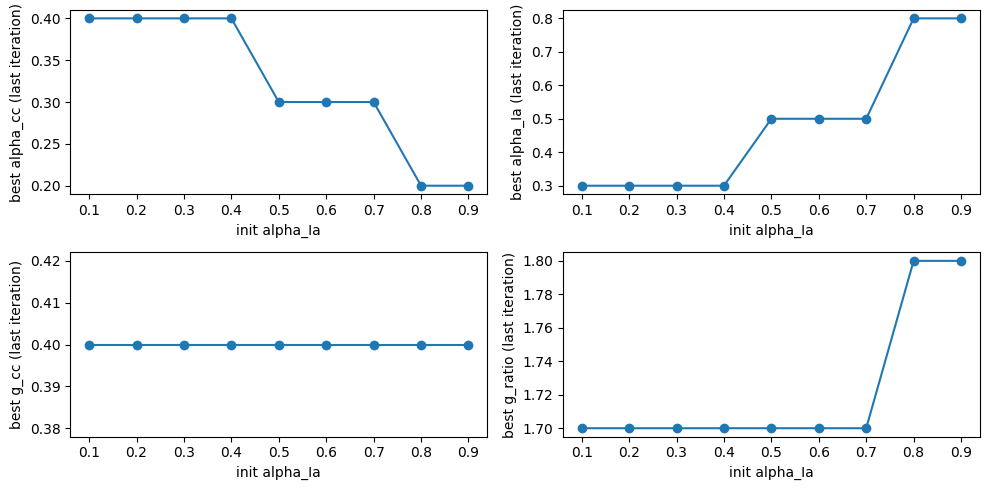

In [8]:
plt.figure(figsize=(10,5))

plt.subplot(2,2,1)
plt.plot(df_best_alpha_Ia['init_val_tested'], df_best_alpha_Ia['best_alpha_cc'], marker='o')
plt.xlabel("init alpha_Ia")
plt.ylabel("best alpha_cc (last iteration)")

plt.subplot(2,2,2)
plt.plot(df_best_alpha_Ia['init_val_tested'], df_best_alpha_Ia['best_alpha_Ia'], marker='o')
plt.xlabel("init alpha_Ia")
plt.ylabel("best alpha_Ia (last iteration)")

plt.subplot(2,2,3)
plt.plot(df_best_alpha_Ia['init_val_tested'], df_best_alpha_Ia['best_g_cc'], marker='o')
plt.xlabel("init alpha_Ia")
plt.ylabel("best g_cc (last iteration)")

plt.subplot(2,2,4)
plt.plot(df_best_alpha_Ia['init_val_tested'], df_best_alpha_Ia['best_g_ratio'], marker='o')
plt.xlabel("init alpha_Ia")
plt.ylabel("best g_ratio (last iteration)")


plt.tight_layout()

In [9]:
best_results_g_cc = []

for val in g_cc_inits:
    output_dir = f"models_no_mask/g_cc_init_{val}/"
    os.makedirs(output_dir, exist_ok=True)
    
    iterative_1D_method.iterative_1D_loop(
        data_path="data_lines_with_vals.csv", 
        output_path=output_dir,
        n_iters=10, grid_size=0.1, grid_len=5, 
        alpha_cc_init=alpha_cc_def, 
        alpha_Ia_init=alpha_Ia_def, 
        g_cc_init=val, 
        g_ratio_init=g_ratio_def
    )
    
    # Read the results and extract the last row
    df_res = pd.read_csv(os.path.join(output_dir, "best_parameters_per_iteration.csv"))
    last_row = df_res.iloc[-1].copy()
    last_row['init_val_tested'] = val
    
    best_results_g_cc.append(last_row)

df_best_g_cc = pd.DataFrame(best_results_g_cc)

alpha_ccs =  [0.2 0.3 0.4 0.5 0.6]
n_gals in each alpha_cc =  300
n_gals total =  1500
Done generating models for alpha_cc, iter = 0, grid size = 0.1, grid_len = 5
Done generating models for alpha_cc, iter = 0, grid size = 0.1, grid_len = 5
Done generating models for alpha_cc, iter = 0, grid size = 0.1, grid_len = 5
Done generating models for alpha_cc, iter = 0, grid size = 0.1, grid_len = 5
Done generating models for alpha_cc, iter = 0, grid size = 0.1, grid_len = 5
iter = 0
best alpha_cc = 0.2
alpha_Ias =  [0.1 0.2 0.3 0.4 0.5]
n_gals in each alpha_Ia =  300
n_gals total =  1200
Done generating models for alpha_Ia, iter = 0, grid size = 0.1, grid_len = 5
Done generating models for alpha_Ia, iter = 0, grid size = 0.1, grid_len = 5
Done generating models for alpha_Ia, iter = 0, grid size = 0.1, grid_len = 5
Done generating models for alpha_Ia, iter = 0, grid size = 0.1, grid_len = 5
Done generating models for alpha_Ia, iter = 0, grid size = 0.1, grid_len = 5
iter = 0
best alpha_Ia = 0.

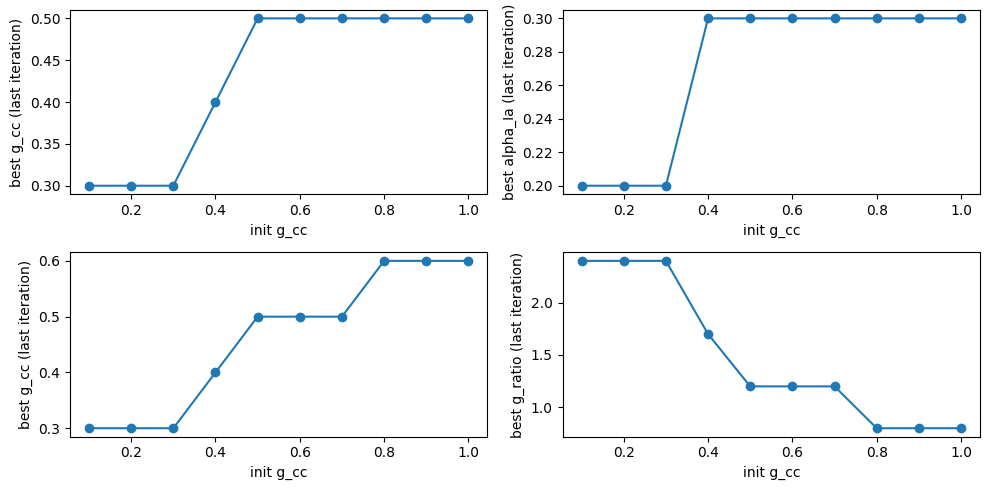

In [10]:
plt.figure(figsize=(10,5))

plt.subplot(2,2,1)
plt.plot(df_best_g_cc['init_val_tested'], df_best_g_cc['best_alpha_cc'], marker='o')
plt.xlabel("init g_cc")
plt.ylabel("best g_cc (last iteration)")

plt.subplot(2,2,2)
plt.plot(df_best_g_cc['init_val_tested'], df_best_g_cc['best_alpha_Ia'], marker='o')
plt.xlabel("init g_cc")
plt.ylabel("best alpha_Ia (last iteration)")

plt.subplot(2,2,3)
plt.plot(df_best_g_cc['init_val_tested'], df_best_g_cc['best_g_cc'], marker='o')
plt.xlabel("init g_cc")
plt.ylabel("best g_cc (last iteration)")

plt.subplot(2,2,4)
plt.plot(df_best_g_cc['init_val_tested'], df_best_g_cc['best_g_ratio'], marker='o')
plt.xlabel("init g_cc")
plt.ylabel("best g_ratio (last iteration)")


plt.tight_layout()

In [28]:
best_results_g_ratio = []

for val in g_ratio_inits:
    output_dir = f"models_no_mask/g_ratio_init_{val}/"
    os.makedirs(output_dir, exist_ok=True)
    
    iterative_1D_method.iterative_1D_loop(
        data_path="data_lines_with_vals.csv", 
        output_path=output_dir,
        n_iters=10, grid_size=0.1, grid_len=5, 
        alpha_cc_init=alpha_cc_def, 
        alpha_Ia_init=alpha_Ia_def, 
        g_cc_init=g_cc_def, 
        g_ratio_init=val
    )
    
    # Read the results and extract the last row
    df_res = pd.read_csv(os.path.join(output_dir, "best_parameters_per_iteration.csv"))
    last_row = df_res.iloc[-1].copy()
    last_row['init_val_tested'] = val
    
    best_results_g_ratio.append(last_row)


df_best_g_ratio = pd.DataFrame(best_results_g_ratio)

alpha_ccs =  [0.2 0.3 0.4 0.5 0.6]
n_gals in each alpha_cc =  300
n_gals total =  1500
Done generating models for alpha_cc, iter = 0, grid size = 0.1, grid_len = 5
Done generating models for alpha_cc, iter = 0, grid size = 0.1, grid_len = 5
Done generating models for alpha_cc, iter = 0, grid size = 0.1, grid_len = 5
Done generating models for alpha_cc, iter = 0, grid size = 0.1, grid_len = 5
Done generating models for alpha_cc, iter = 0, grid size = 0.1, grid_len = 5
iter = 0
best alpha_cc = 0.2
alpha_Ias =  [0.1 0.2 0.3 0.4 0.5]
n_gals in each alpha_Ia =  300
n_gals total =  1200
Done generating models for alpha_Ia, iter = 0, grid size = 0.1, grid_len = 5
Done generating models for alpha_Ia, iter = 0, grid size = 0.1, grid_len = 5
Done generating models for alpha_Ia, iter = 0, grid size = 0.1, grid_len = 5
Done generating models for alpha_Ia, iter = 0, grid size = 0.1, grid_len = 5
Done generating models for alpha_Ia, iter = 0, grid size = 0.1, grid_len = 5
iter = 0
best alpha_Ia = 0.

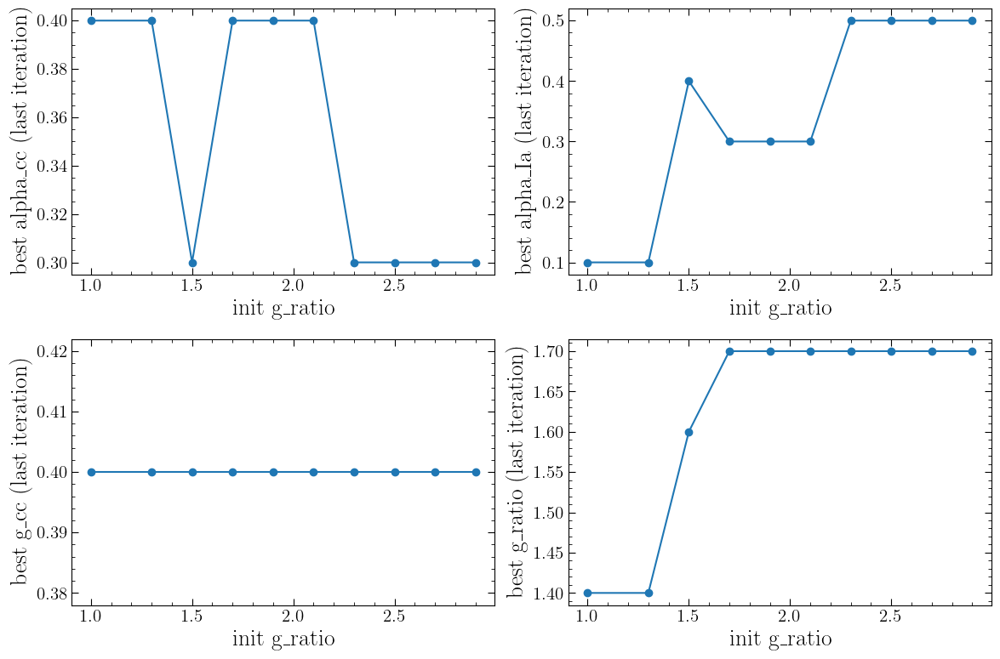

In [31]:
plt.figure(figsize=(12,8))

plt.subplot(2,2,1)
plt.plot(df_best_g_ratio['init_val_tested'], df_best_g_ratio['best_alpha_cc'], marker='o')
plt.xlabel("init g_ratio")
plt.ylabel("best alpha_cc (last iteration)")

plt.subplot(2,2,2)
plt.plot(df_best_g_ratio['init_val_tested'], df_best_g_ratio['best_alpha_Ia'], marker='o')
plt.xlabel("init g_ratio")
plt.ylabel("best alpha_Ia (last iteration)")

plt.subplot(2,2,3)
plt.plot(df_best_g_ratio['init_val_tested'], df_best_g_ratio['best_g_cc'], marker='o')
plt.xlabel("init g_ratio")
plt.ylabel("best g_cc (last iteration)")

plt.subplot(2,2,4)
plt.plot(df_best_g_ratio['init_val_tested'], df_best_g_ratio['best_g_ratio'], marker='o')
plt.xlabel("init g_ratio")
plt.ylabel("best g_ratio (last iteration)")


plt.tight_layout()

# Plot the last iterations

In [15]:
best_pars_alpha_cc_init_01 = pd.read_csv("models_no_mask/alpha_cc_init_0.1/best_parameters_per_iteration.csv")

In [25]:
best_pars_alpha_cc_init_01

,iteration,best_alpha_cc,best_alpha_Ia,best_g_cc,best_g_ratio
0,0,0.3,0.3,0.4,1.8
1,0,0.3,0.5,0.4,1.8
2,0,0.3,0.5,0.4,1.8
3,0,0.3,0.5,0.4,1.7
4,1,0.3,0.5,0.4,1.7
5,1,0.3,0.5,0.4,1.7
6,1,0.3,0.5,0.4,1.7
7,1,0.3,0.5,0.4,1.7
8,2,0.3,0.5,0.4,1.7
9,2,0.3,0.5,0.4,1.7


In [93]:
folders = ['models_no_mask/alpha_cc_init_0.1/', 'models_no_mask/alpha_cc_init_0.2/']
row_titles = ['models_no_mask/alpha_cc_init_0.1', 'models_no_mask/alpha_cc_init_0.2']

plt.figure(figsize=(20, 10))

for row_idx in range(len(folders)):
    folder_path = folders[row_idx]
    
    # Read data for the current folder
    output_dfs = []
    for filename in os.listdir(folder_path):
        if filename.startswith("alpha_cc_iter9") and filename.endswith(".csv"):
            df = pd.read_csv(folder_path + filename)
            output_dfs.append(df)
            
    # Plot data in the respective row
    for i in range(len(output_dfs)):
        model_df = output_dfs[i]
        mg_h_bins = model_df['mg_h_bin'].unique()
        
        for j in range(len(mg_h_bins)):
            mg_h_bin = mg_h_bins[j]
            model_subset = model_df[np.isclose(model_df['mg_h_bin'], mg_h_bin)]
            data_subset = data[np.isclose(data['mg_h_bin_center'], mg_h_bin)]
            
            data_line_xs = fe_mg_centers
            data_line_ys = data_subset['slope_mn_fe'].iloc[0] * fe_mg_centers + data_subset['intercept_mn_fe'].iloc[0]
            
            # Calculate grid position (1 to 10)
            plot_index = (row_idx * 5) + j + 1
            plt.subplot(2, 5, plot_index)
            
            plt.plot(data_line_xs, data_line_ys, marker='o', color='black')
            plt.scatter(model_subset['fe_mg'], model_subset['mn_fe'], label=f"alpha_cc = {model_subset['alpha_cc'].iloc[0]:.2f}",
                        s = 10)
            
            #plt.xlim(-0.60, 0.25)
            #plt.ylim(-0.8, 0.40)
            plt.grid(True, alpha=0.3)
            plt.xlabel("[Fe/Mg]")
            
            if j == 0:
                # Add the row title to the first plot of each row
                plt.ylabel(f"{row_titles[row_idx]}\n\n[Mn/Fe]")
                plt.legend()

plt.tight_layout()
plt.show()

NameError: name 'data' is not defined

<Figure size 2000x1000 with 0 Axes>

In [94]:
folders = ['models_no_mask/alpha_cc_init_0.1/', 'models_no_mask/alpha_cc_init_0.2/']
row_titles = ['models_no_mask/alpha_cc_init_0.1', 'models_no_mask/alpha_cc_init_0.2']

# Define the iteration variable and build the search prefix
iter_num = 9
file_prefix = "alpha_cc_iter" + str(iter_num)

plt.figure(figsize=(20, 10))

for row_idx in range(len(folders)):
    folder_path = folders[row_idx]
    
    # Read best parameters to find best_alpha_cc for the current iteration
    best_params_path = folder_path + "best_parameters_per_iteration.csv"
    best_params_df = pd.read_csv(best_params_path)
    
    best_alpha_cc = None
    for k in range(len(best_params_df)):
        if best_params_df['iteration'].iloc[k] == iter_num:
            best_alpha_cc = best_params_df['best_alpha_cc'].iloc[k]
            break
            
    # Read data for the current folder
    output_dfs = []
    for filename in os.listdir(folder_path):
        if filename.startswith(file_prefix) and filename.endswith(".csv"):
            df = pd.read_csv(folder_path + filename)
            output_dfs.append(df)
            
    # Plot data in the respective row
    for i in range(len(output_dfs)):
        model_df = output_dfs[i]
        mg_h_bins = model_df['mg_h_bin'].unique()
        
        for j in range(len(mg_h_bins)):
            mg_h_bin = mg_h_bins[j]
            model_subset = model_df[np.isclose(model_df['mg_h_bin'], mg_h_bin)]
            data_subset = data[np.isclose(data['mg_h_bin_center'], mg_h_bin)]
            
            data_line_xs = fe_mg_centers
            data_line_ys = data_subset['slope_mn_fe'].iloc[0] * fe_mg_centers + data_subset['intercept_mn_fe'].iloc[0]
            
            # Calculate grid position (1 to 10)
            plot_index = (row_idx * 5) + j + 1
            plt.subplot(2, 5, plot_index)
            
            plt.plot(data_line_xs, data_line_ys, marker='o', color='black')
            
            # Check if current model's alpha_cc matches the best_alpha_cc
            current_alpha_cc = model_subset['alpha_cc'].iloc[0]
            point_color = 'steelblue' # Default color
            
            if best_alpha_cc is not None:
                if np.isclose(current_alpha_cc, best_alpha_cc):
                    point_color = 'hotpink'
                    plt.scatter(model_subset['fe_mg'], model_subset['mn_fe'], 
                                            label=f"alpha_cc = {current_alpha_cc:.2f}", color = 'gray', s=30,
                                            zorder=10, edgecolors='black')
            
            plt.scatter(model_subset['fe_mg'], model_subset['mn_fe'], 
                        label=f"alpha_cc = {current_alpha_cc:.2f}",
                        s=10)
            
            #plt.xlim(-0.60, 0.25)
            #plt.ylim(-0.8, 0.40)
            plt.grid(True, alpha=0.3)
            plt.xlabel("[Fe/Mg]")
            
            if j == 0:
                # Add the row title to the first plot of each row
                plt.ylabel(f"{row_titles[row_idx]}\n\n[Mn/Fe]")
                plt.legend()

plt.tight_layout()
plt.show()

NameError: name 'data' is not defined

<Figure size 2000x1000 with 0 Axes>

In [95]:
import matplotlib.cm as cm

folders = ['models_no_mask/alpha_cc_init_0.1/', 'models_no_mask/alpha_cc_init_0.2/']
row_titles = ['models_no_mask/alpha_cc_init_0.1', 'models_no_mask/alpha_cc_init_0.2']

iter_num = 9
file_prefix = "alpha_cc_iter" + str(iter_num)

plt.figure(figsize=(23, 10))

for row_idx in range(len(folders)):
    folder_path = folders[row_idx]
    
    # Read best parameters to find best_alpha_cc
    best_params_path = folder_path + "best_parameters_per_iteration.csv"
    best_params_df = pd.read_csv(best_params_path)
    
    best_alpha_cc = None
    for k in range(len(best_params_df)):
        if best_params_df['iteration'].iloc[k] == iter_num:
            best_alpha_cc = best_params_df['best_alpha_cc'].iloc[k]
            best_alpha_Ia = best_params_df['best_alpha_Ia'].iloc[k]
            best_g_cc = best_params_df['best_g_cc'].iloc[k]
            best_g_ratio = best_params_df['best_g_ratio'].iloc[k]
            break
            
    # Read data for the current folder
    output_dfs = []
    for filename in os.listdir(folder_path):
        if filename.startswith(file_prefix) and filename.endswith(".csv"):
            df = pd.read_csv(folder_path + filename)
            output_dfs.append(df)
            
    # Plot data in the respective row
    for i in range(len(output_dfs)):
        model_df = output_dfs[i]
        mg_h_bins = model_df['mg_h_bin'].unique()
        
        # Calculate a shade of blue for this file (ranging from 0.3 to 0.9 so it's not too light)
        if len(output_dfs) > 1:
            color_intensity = 0.3 + (0.6 * (i / (len(output_dfs) - 1)))
        else:
            color_intensity = 0.6
        shade_of_blue = cm.Blues(color_intensity)
        
        for j in range(len(mg_h_bins)):
            mg_h_bin = mg_h_bins[j]
            model_subset = model_df[np.isclose(model_df['mg_h_bin'], mg_h_bin)]
            data_subset = data[np.isclose(data['mg_h_bin_center'], mg_h_bin)]
            
            data_line_xs = fe_mg_centers
            data_line_ys = data_subset['slope_mn_fe'].iloc[0] * fe_mg_centers + data_subset['intercept_mn_fe'].iloc[0]
            
            plot_index = (row_idx * 5) + j + 1
            plt.subplot(2, 5, plot_index)
            
            plt.plot(data_line_xs, data_line_ys, marker='o', color='black', zorder=20)
            
            current_alpha_cc = model_subset['alpha_cc'].iloc[0]
            
            # Check if this model is the best one and assign color
            if best_alpha_cc is not None:
                if np.isclose(current_alpha_cc, best_alpha_cc):
                    point_color = 'hotpink'
                    zorder = 10
                else:
                    point_color = shade_of_blue
                    zorder = 5
            else:
                point_color = shade_of_blue
            
            plt.scatter(model_subset['fe_mg'], model_subset['mn_fe'], 
                        label=f"alpha_cc = {current_alpha_cc:.2f}, alpha_Ia = {model_subset['alpha_Ia'].iloc[0]}, g_cc = {model_subset['g_cc'].iloc[0]}, g_ratio = {model_subset['g_ratio'].iloc[0] :.2f}",
                        color=point_color,
                        s=20, zorder=zorder)
            plt.xlim(-0.60, 0.25)
            plt.ylim(-0.8, 0.30)
            plt.grid(True, alpha=0.3)
            plt.xlabel("[Fe/Mg]")
            
            if j == 0:
                plt.ylabel(f"{row_titles[row_idx]}\n\n[Mn/Fe]")
            if j == 4:
                plt.legend(fontsize = 16)

plt.suptitle(f"Iteration {iter_num}, no mask, good range of eta and tau*")
plt.tight_layout()
plt.show()

NameError: name 'data' is not defined

<Figure size 2300x1000 with 0 Axes>

In [96]:
folders = ['models_no_mask/alpha_cc_init_0.1/', 'models_no_mask/alpha_cc_init_0.2/']
row_titles = ['models_no_mask/alpha_cc_init_0.1', 'models_no_mask/alpha_cc_init_0.2']

iter_num = 9
file_prefix = "alpha_Ia_iter" + str(iter_num)

plt.figure(figsize=(23, 10))

for row_idx in range(len(folders)):
    folder_path = folders[row_idx]
    
    # Read best parameters to find best_alpha_cc
    best_params_path = folder_path + "best_parameters_per_iteration.csv"
    best_params_df = pd.read_csv(best_params_path)
    
    best_alpha_cc = None
    for k in range(len(best_params_df)):
        if best_params_df['iteration'].iloc[k] == iter_num:
            best_alpha_cc = best_params_df['best_alpha_cc'].iloc[k]
            best_alpha_Ia = best_params_df['best_alpha_Ia'].iloc[k]
            best_g_cc = best_params_df['best_g_cc'].iloc[k]
            best_g_ratio = best_params_df['best_g_ratio'].iloc[k]
            break
            
    # Read data for the current folder
    output_dfs = []
    for filename in os.listdir(folder_path):
        if filename.startswith(file_prefix) and filename.endswith(".csv"):
            df = pd.read_csv(folder_path + filename)
            output_dfs.append(df)
            
    # Plot data in the respective row
    for i in range(len(output_dfs)):
        model_df = output_dfs[i]
        mg_h_bins = model_df['mg_h_bin'].unique()
        
        # Calculate a shade of blue for this file (ranging from 0.3 to 0.9 so it's not too light)
        if len(output_dfs) > 1:
            color_intensity = 0.3 + (0.6 * (i / (len(output_dfs) - 1)))
        else:
            color_intensity = 0.6
        shade_of_blue = cm.Blues(color_intensity)
        
        for j in range(len(mg_h_bins)):
            mg_h_bin = mg_h_bins[j]
            model_subset = model_df[np.isclose(model_df['mg_h_bin'], mg_h_bin)]
            data_subset = data[np.isclose(data['mg_h_bin_center'], mg_h_bin)]
            
            data_line_xs = fe_mg_centers
            data_line_ys = data_subset['slope_mn_fe'].iloc[0] * fe_mg_centers + data_subset['intercept_mn_fe'].iloc[0]
            
            plot_index = (row_idx * 5) + j + 1
            plt.subplot(2, 5, plot_index)
            
            plt.plot(data_line_xs, data_line_ys, marker='o', color='black', zorder=20)
            
            current_alpha_cc = model_subset['alpha_cc'].iloc[0]
            
            # Check if this model is the best one and assign color
            if best_alpha_cc is not None:
                if np.isclose(model_subset['alpha_Ia'].iloc[0], best_alpha_Ia):
                    point_color = 'hotpink'
                    zorder = 10
                else:
                    point_color = shade_of_blue
                    zorder = 5
            else:
                point_color = shade_of_blue
            
            plt.scatter(model_subset['fe_mg'], model_subset['mn_fe'], 
                        label=f"alpha_cc = {current_alpha_cc:.2f}, alpha_Ia = {model_subset['alpha_Ia'].iloc[0]:.2f}, g_cc = {model_subset['g_cc'].iloc[0]:.2f}, g_ratio = {model_subset['g_ratio'].iloc[0] :.2f}",
                        color=point_color,
                        s=20, zorder=zorder)
            plt.xlim(-0.60, 0.25)
            plt.ylim(-0.8, 0.30)
            plt.grid(True, alpha=0.3)
            plt.xlabel("[Fe/Mg]")
            
            if j == 0:
                plt.ylabel(f"{row_titles[row_idx]}\n\n[Mn/Fe]")
            if j == 4:
                plt.legend(fontsize = 16)

plt.suptitle(f"Iteration {iter_num}, no mask, good range of eta and tau*")
plt.tight_layout()
plt.show()

NameError: name 'data' is not defined

<Figure size 2300x1000 with 0 Axes>

In [97]:
folders = ['models_no_mask/alpha_cc_init_0.1/', 'models_no_mask/alpha_cc_init_0.2/']
row_titles = ['models_no_mask/alpha_cc_init_0.1', 'models_no_mask/alpha_cc_init_0.2']

iter_num = 9
file_prefix = "g_cc_iter" + str(iter_num)

plt.figure(figsize=(23, 10))

for row_idx in range(len(folders)):
    folder_path = folders[row_idx]
    
    # Read best parameters to find best_alpha_cc
    best_params_path = folder_path + "best_parameters_per_iteration.csv"
    best_params_df = pd.read_csv(best_params_path)
    
    best_alpha_cc = None
    for k in range(len(best_params_df)):
        if best_params_df['iteration'].iloc[k] == iter_num:
            best_alpha_cc = best_params_df['best_alpha_cc'].iloc[k]
            best_alpha_Ia = best_params_df['best_alpha_Ia'].iloc[k]
            best_g_cc = best_params_df['best_g_cc'].iloc[k]
            best_g_ratio = best_params_df['best_g_ratio'].iloc[k]
            break
            
    # Read data for the current folder
    output_dfs = []
    for filename in os.listdir(folder_path):
        if filename.startswith(file_prefix) and filename.endswith(".csv"):
            df = pd.read_csv(folder_path + filename)
            output_dfs.append(df)
            
    # Plot data in the respective row
    for i in range(len(output_dfs)):
        model_df = output_dfs[i]
        mg_h_bins = model_df['mg_h_bin'].unique()
        
        # Calculate a shade of blue for this file (ranging from 0.3 to 0.9 so it's not too light)
        if len(output_dfs) > 1:
            color_intensity = 0.3 + (0.6 * (i / (len(output_dfs) - 1)))
        else:
            color_intensity = 0.6
        shade_of_blue = cm.Blues(color_intensity)
        
        for j in range(len(mg_h_bins)):
            mg_h_bin = mg_h_bins[j]
            model_subset = model_df[np.isclose(model_df['mg_h_bin'], mg_h_bin)]
            data_subset = data[np.isclose(data['mg_h_bin_center'], mg_h_bin)]
            
            data_line_xs = fe_mg_centers
            data_line_ys = data_subset['slope_mn_fe'].iloc[0] * fe_mg_centers + data_subset['intercept_mn_fe'].iloc[0]
            
            plot_index = (row_idx * 5) + j + 1
            plt.subplot(2, 5, plot_index)
            
            plt.plot(data_line_xs, data_line_ys, marker='o', color='black', zorder=20)
            
            current_alpha_cc = model_subset['alpha_cc'].iloc[0]
            
            # Check if this model is the best one and assign color
            if best_alpha_cc is not None:
                if np.isclose(model_subset['g_cc'].iloc[0], best_g_cc):
                    point_color = 'hotpink'
                    zorder = 10
                else:
                    point_color = shade_of_blue
                    zorder = 5
            else:
                point_color = shade_of_blue
            
            plt.scatter(model_subset['fe_mg'], model_subset['mn_fe'], 
                        label=f"alpha_cc = {current_alpha_cc:.2f}, alpha_Ia = {model_subset['alpha_Ia'].iloc[0]:.2f}, g_cc = {model_subset['g_cc'].iloc[0]:.2f}, g_ratio = {model_subset['g_ratio'].iloc[0] :.2f}",
                        color=point_color,
                        s=20, zorder=zorder)
            plt.xlim(-0.60, 0.25)
            plt.ylim(-0.8, 0.30)
            plt.grid(True, alpha=0.3)
            plt.xlabel("[Fe/Mg]")
            
            if j == 0:
                plt.ylabel(f"{row_titles[row_idx]}\n\n[Mn/Fe]")
            if j == 4:
                plt.legend(fontsize = 16)

plt.suptitle(f"Iteration {iter_num}, no mask, good range of eta and tau*")
plt.tight_layout()
plt.show()

NameError: name 'data' is not defined

<Figure size 2300x1000 with 0 Axes>

In [98]:
folders = ['models_no_mask/alpha_cc_init_0.1/', 'models_no_mask/alpha_cc_init_0.2/']
row_titles = ['models_no_mask/alpha_cc_init_0.1', 'models_no_mask/alpha_cc_init_0.2']

iter_num = 9
file_prefix = "g_ratio_iter" + str(iter_num)

plt.figure(figsize=(23, 10))

for row_idx in range(len(folders)):
    folder_path = folders[row_idx]
    
    # Read best parameters to find best_alpha_cc
    best_params_path = folder_path + "best_parameters_per_iteration.csv"
    best_params_df = pd.read_csv(best_params_path)
    
    best_alpha_cc = None
    for k in range(len(best_params_df)):
        if best_params_df['iteration'].iloc[k] == iter_num:
            best_alpha_cc = best_params_df['best_alpha_cc'].iloc[k]
            best_alpha_Ia = best_params_df['best_alpha_Ia'].iloc[k]
            best_g_cc = best_params_df['best_g_cc'].iloc[k]
            best_g_ratio = best_params_df['best_g_ratio'].iloc[k]
            break
            
    # Read data for the current folder
    output_dfs = []
    for filename in os.listdir(folder_path):
        if filename.startswith(file_prefix) and filename.endswith(".csv"):
            df = pd.read_csv(folder_path + filename)
            output_dfs.append(df)
            
    # Plot data in the respective row
    for i in range(len(output_dfs)):
        model_df = output_dfs[i]
        mg_h_bins = model_df['mg_h_bin'].unique()
        
        # Calculate a shade of blue for this file (ranging from 0.3 to 0.9 so it's not too light)
        if len(output_dfs) > 1:
            color_intensity = 0.3 + (0.6 * (i / (len(output_dfs) - 1)))
        else:
            color_intensity = 0.6
        shade_of_blue = cm.Blues(color_intensity)
        
        for j in range(len(mg_h_bins)):
            mg_h_bin = mg_h_bins[j]
            model_subset = model_df[np.isclose(model_df['mg_h_bin'], mg_h_bin)]
            data_subset = data[np.isclose(data['mg_h_bin_center'], mg_h_bin)]
            
            data_line_xs = fe_mg_centers
            data_line_ys = data_subset['slope_mn_fe'].iloc[0] * fe_mg_centers + data_subset['intercept_mn_fe'].iloc[0]
            
            plot_index = (row_idx * 5) + j + 1
            plt.subplot(2, 5, plot_index)
            
            plt.plot(data_line_xs, data_line_ys, marker='o', color='black', zorder=20)
            
            current_alpha_cc = model_subset['alpha_cc'].iloc[0]
            
            # Check if this model is the best one and assign color
            if best_alpha_cc is not None:
                if np.isclose(model_subset['g_ratio'].iloc[0], best_g_ratio):
                    point_color = 'hotpink'
                    zorder = 10
                else:
                    point_color = shade_of_blue
                    zorder = 5
            else:
                point_color = shade_of_blue
            
            plt.scatter(model_subset['fe_mg'], model_subset['mn_fe'], 
                        label=f"alpha_cc = {current_alpha_cc:.2f}, alpha_Ia = {model_subset['alpha_Ia'].iloc[0]:.2f}, g_cc = {model_subset['g_cc'].iloc[0]:.2f}, g_ratio = {model_subset['g_ratio'].iloc[0] :.2f}",
                        color=point_color,
                        s=20, zorder=zorder)
            plt.xlim(-0.60, 0.25)
            plt.ylim(-0.8, 0.30)
            plt.grid(True, alpha=0.3)
            plt.xlabel("[Fe/Mg]")
            
            if j == 0:
                plt.ylabel(f"{row_titles[row_idx]}\n\n[Mn/Fe]")
            if j == 4:
                plt.legend(fontsize = 16)

plt.suptitle(f"Iteration {iter_num}, no mask, good range of eta and tau*")
plt.tight_layout()
plt.show()

NameError: name 'data' is not defined

<Figure size 2300x1000 with 0 Axes>

# ALPHA_IA
## Anomaly between alpha_ia_init = 0.4 and 0.5

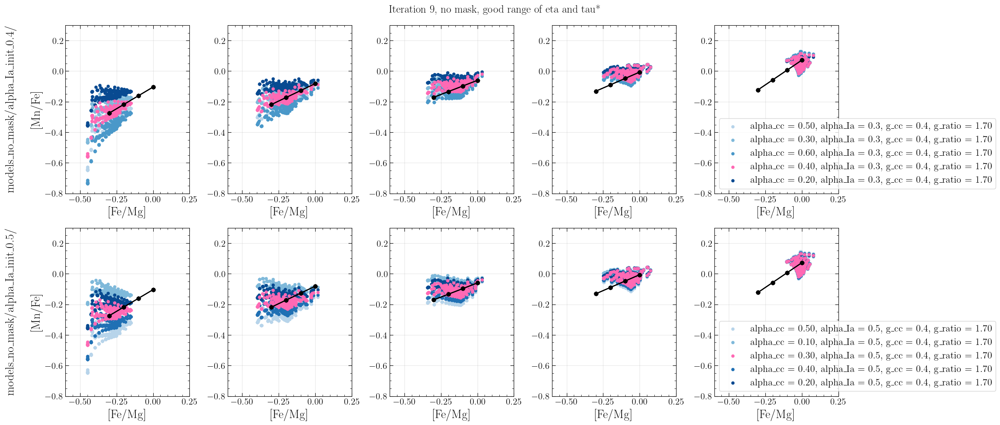

In [5]:
import matplotlib.cm as cm

folders = ['models_no_mask/alpha_Ia_init_0.4/', 'models_no_mask/alpha_Ia_init_0.5/']
row_titles = folders

iter_num = 9
file_prefix = "alpha_cc_iter" + str(iter_num)

plt.figure(figsize=(23, 10))

for row_idx in range(len(folders)):
    folder_path = folders[row_idx]
    
    # Read best parameters to find best_alpha_cc
    best_params_path = folder_path + "best_parameters_per_iteration.csv"
    best_params_df = pd.read_csv(best_params_path)
    
    best_alpha_cc = None
    for k in range(len(best_params_df)):
        if best_params_df['iteration'].iloc[k] == iter_num:
            best_alpha_cc = best_params_df['best_alpha_cc'].iloc[k]
            best_alpha_Ia = best_params_df['best_alpha_Ia'].iloc[k]
            best_g_cc = best_params_df['best_g_cc'].iloc[k]
            best_g_ratio = best_params_df['best_g_ratio'].iloc[k]
            break
            
    # Read data for the current folder
    output_dfs = []
    for filename in os.listdir(folder_path):
        if filename.startswith(file_prefix) and filename.endswith(".csv"):
            df = pd.read_csv(folder_path + filename)
            output_dfs.append(df)
            
    # Plot data in the respective row
    for i in range(len(output_dfs)):
        model_df = output_dfs[i]
        mg_h_bins = model_df['mg_h_bin'].unique()
        
        # Calculate a shade of blue for this file (ranging from 0.3 to 0.9 so it's not too light)
        if len(output_dfs) > 1:
            color_intensity = 0.3 + (0.6 * (i / (len(output_dfs) - 1)))
        else:
            color_intensity = 0.6
        shade_of_blue = cm.Blues(color_intensity)
        
        for j in range(len(mg_h_bins)):
            mg_h_bin = mg_h_bins[j]
            model_subset = model_df[np.isclose(model_df['mg_h_bin'], mg_h_bin)]
            data_subset = data[np.isclose(data['mg_h_bin_center'], mg_h_bin)]
            
            data_line_xs = fe_mg_centers
            data_line_ys = data_subset['slope_mn_fe'].iloc[0] * fe_mg_centers + data_subset['intercept_mn_fe'].iloc[0]
            
            plot_index = (row_idx * 5) + j + 1
            plt.subplot(2, 5, plot_index)
            
            plt.plot(data_line_xs, data_line_ys, marker='o', color='black', zorder=20)
            
            current_alpha_cc = model_subset['alpha_cc'].iloc[0]
            
            # Check if this model is the best one and assign color
            if best_alpha_cc is not None:
                if np.isclose(current_alpha_cc, best_alpha_cc):
                    point_color = 'hotpink'
                    zorder = 10
                else:
                    point_color = shade_of_blue
                    zorder = 5
            else:
                point_color = shade_of_blue
            
            plt.scatter(model_subset['fe_mg'], model_subset['mn_fe'], 
                        label=f"alpha_cc = {current_alpha_cc:.2f}, alpha_Ia = {model_subset['alpha_Ia'].iloc[0]}, g_cc = {model_subset['g_cc'].iloc[0]}, g_ratio = {model_subset['g_ratio'].iloc[0] :.2f}",
                        color=point_color,
                        s=20, zorder=zorder)
            plt.xlim(-0.60, 0.25)
            plt.ylim(-0.8, 0.30)
            plt.grid(True, alpha=0.3)
            plt.xlabel("[Fe/Mg]")
            
            if j == 0:
                plt.ylabel(f"{row_titles[row_idx]}\n\n[Mn/Fe]")
            if j == 4:
                plt.legend(fontsize = 16)

plt.suptitle(f"Iteration {iter_num}, no mask, good range of eta and tau*")
plt.tight_layout()
plt.show()

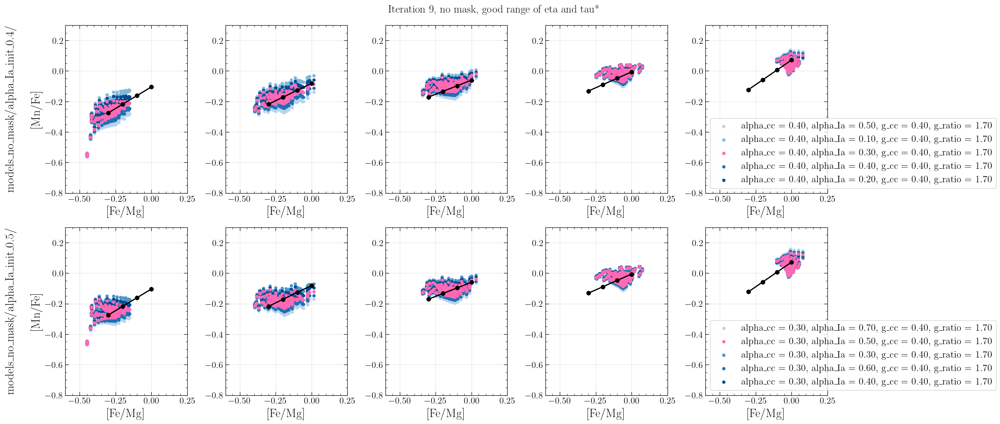

In [6]:
folders = ['models_no_mask/alpha_Ia_init_0.4/', 'models_no_mask/alpha_Ia_init_0.5/']
row_titles = folders

iter_num = 9
file_prefix = "alpha_Ia_iter" + str(iter_num)

plt.figure(figsize=(23, 10))

for row_idx in range(len(folders)):
    folder_path = folders[row_idx]
    
    # Read best parameters to find best_alpha_cc
    best_params_path = folder_path + "best_parameters_per_iteration.csv"
    best_params_df = pd.read_csv(best_params_path)
    
    best_alpha_cc = None
    for k in range(len(best_params_df)):
        if best_params_df['iteration'].iloc[k] == iter_num:
            best_alpha_cc = best_params_df['best_alpha_cc'].iloc[k]
            best_alpha_Ia = best_params_df['best_alpha_Ia'].iloc[k]
            best_g_cc = best_params_df['best_g_cc'].iloc[k]
            best_g_ratio = best_params_df['best_g_ratio'].iloc[k]
            break
            
    # Read data for the current folder
    output_dfs = []
    for filename in os.listdir(folder_path):
        if filename.startswith(file_prefix) and filename.endswith(".csv"):
            df = pd.read_csv(folder_path + filename)
            output_dfs.append(df)
            
    # Plot data in the respective row
    for i in range(len(output_dfs)):
        model_df = output_dfs[i]
        mg_h_bins = model_df['mg_h_bin'].unique()
        
        # Calculate a shade of blue for this file (ranging from 0.3 to 0.9 so it's not too light)
        if len(output_dfs) > 1:
            color_intensity = 0.3 + (0.6 * (i / (len(output_dfs) - 1)))
        else:
            color_intensity = 0.6
        shade_of_blue = cm.Blues(color_intensity)
        
        for j in range(len(mg_h_bins)):
            mg_h_bin = mg_h_bins[j]
            model_subset = model_df[np.isclose(model_df['mg_h_bin'], mg_h_bin)]
            data_subset = data[np.isclose(data['mg_h_bin_center'], mg_h_bin)]
            
            data_line_xs = fe_mg_centers
            data_line_ys = data_subset['slope_mn_fe'].iloc[0] * fe_mg_centers + data_subset['intercept_mn_fe'].iloc[0]
            
            plot_index = (row_idx * 5) + j + 1
            plt.subplot(2, 5, plot_index)
            
            plt.plot(data_line_xs, data_line_ys, marker='o', color='black', zorder=20)
            
            current_alpha_cc = model_subset['alpha_cc'].iloc[0]
            
            # Check if this model is the best one and assign color
            if best_alpha_cc is not None:
                if np.isclose(model_subset['alpha_Ia'].iloc[0], best_alpha_Ia):
                    point_color = 'hotpink'
                    zorder = 10
                else:
                    point_color = shade_of_blue
                    zorder = 5
            else:
                point_color = shade_of_blue
            
            plt.scatter(model_subset['fe_mg'], model_subset['mn_fe'], 
                        label=f"alpha_cc = {current_alpha_cc:.2f}, alpha_Ia = {model_subset['alpha_Ia'].iloc[0]:.2f}, g_cc = {model_subset['g_cc'].iloc[0]:.2f}, g_ratio = {model_subset['g_ratio'].iloc[0] :.2f}",
                        color=point_color,
                        s=20, zorder=zorder)
            plt.xlim(-0.60, 0.25)
            plt.ylim(-0.8, 0.30)
            plt.grid(True, alpha=0.3)
            plt.xlabel("[Fe/Mg]")
            
            if j == 0:
                plt.ylabel(f"{row_titles[row_idx]}\n\n[Mn/Fe]")
            if j == 4:
                plt.legend(fontsize = 16)

plt.suptitle(f"Iteration {iter_num}, no mask, good range of eta and tau*")
plt.tight_layout()
plt.show()

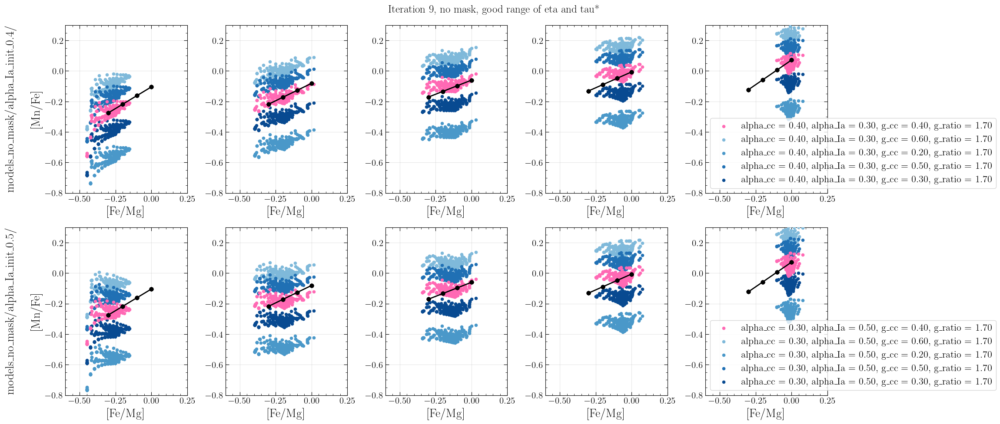

In [7]:
folders = ['models_no_mask/alpha_Ia_init_0.4/', 'models_no_mask/alpha_Ia_init_0.5/']
row_titles = folders

iter_num = 9
file_prefix = "g_cc_iter" + str(iter_num)

plt.figure(figsize=(23, 10))

for row_idx in range(len(folders)):
    folder_path = folders[row_idx]
    
    # Read best parameters to find best_alpha_cc
    best_params_path = folder_path + "best_parameters_per_iteration.csv"
    best_params_df = pd.read_csv(best_params_path)
    
    best_alpha_cc = None
    for k in range(len(best_params_df)):
        if best_params_df['iteration'].iloc[k] == iter_num:
            best_alpha_cc = best_params_df['best_alpha_cc'].iloc[k]
            best_alpha_Ia = best_params_df['best_alpha_Ia'].iloc[k]
            best_g_cc = best_params_df['best_g_cc'].iloc[k]
            best_g_ratio = best_params_df['best_g_ratio'].iloc[k]
            break
            
    # Read data for the current folder
    output_dfs = []
    for filename in os.listdir(folder_path):
        if filename.startswith(file_prefix) and filename.endswith(".csv"):
            df = pd.read_csv(folder_path + filename)
            output_dfs.append(df)
            
    # Plot data in the respective row
    for i in range(len(output_dfs)):
        model_df = output_dfs[i]
        mg_h_bins = model_df['mg_h_bin'].unique()
        
        # Calculate a shade of blue for this file (ranging from 0.3 to 0.9 so it's not too light)
        if len(output_dfs) > 1:
            color_intensity = 0.3 + (0.6 * (i / (len(output_dfs) - 1)))
        else:
            color_intensity = 0.6
        shade_of_blue = cm.Blues(color_intensity)
        
        for j in range(len(mg_h_bins)):
            mg_h_bin = mg_h_bins[j]
            model_subset = model_df[np.isclose(model_df['mg_h_bin'], mg_h_bin)]
            data_subset = data[np.isclose(data['mg_h_bin_center'], mg_h_bin)]
            
            data_line_xs = fe_mg_centers
            data_line_ys = data_subset['slope_mn_fe'].iloc[0] * fe_mg_centers + data_subset['intercept_mn_fe'].iloc[0]
            
            plot_index = (row_idx * 5) + j + 1
            plt.subplot(2, 5, plot_index)
            
            plt.plot(data_line_xs, data_line_ys, marker='o', color='black', zorder=20)
            
            current_alpha_cc = model_subset['alpha_cc'].iloc[0]
            
            # Check if this model is the best one and assign color
            if best_alpha_cc is not None:
                if np.isclose(model_subset['g_cc'].iloc[0], best_g_cc):
                    point_color = 'hotpink'
                    zorder = 10
                else:
                    point_color = shade_of_blue
                    zorder = 5
            else:
                point_color = shade_of_blue
            
            plt.scatter(model_subset['fe_mg'], model_subset['mn_fe'], 
                        label=f"alpha_cc = {current_alpha_cc:.2f}, alpha_Ia = {model_subset['alpha_Ia'].iloc[0]:.2f}, g_cc = {model_subset['g_cc'].iloc[0]:.2f}, g_ratio = {model_subset['g_ratio'].iloc[0] :.2f}",
                        color=point_color,
                        s=20, zorder=zorder)
            plt.xlim(-0.60, 0.25)
            plt.ylim(-0.8, 0.30)
            plt.grid(True, alpha=0.3)
            plt.xlabel("[Fe/Mg]")
            
            if j == 0:
                plt.ylabel(f"{row_titles[row_idx]}\n\n[Mn/Fe]")
            if j == 4:
                plt.legend(fontsize = 16)

plt.suptitle(f"Iteration {iter_num}, no mask, good range of eta and tau*")
plt.tight_layout()
plt.show()

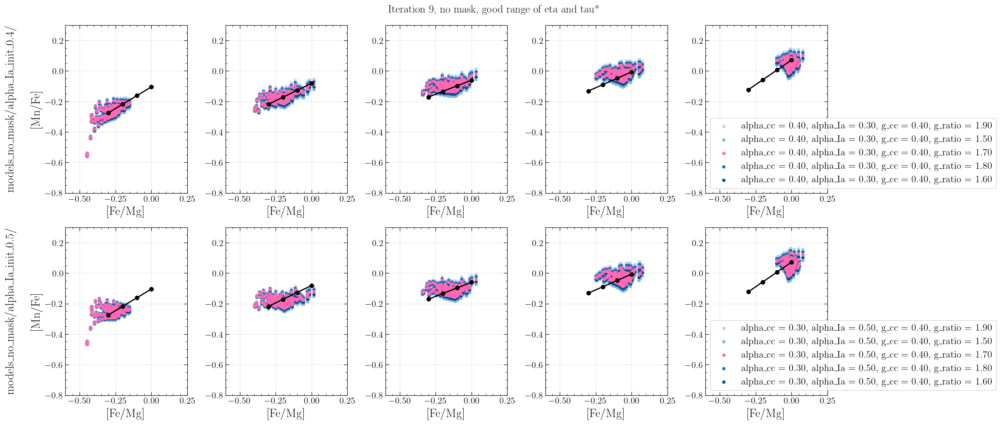

In [8]:
folders = ['models_no_mask/alpha_Ia_init_0.4/', 'models_no_mask/alpha_Ia_init_0.5/']
row_titles = folders

iter_num = 9
file_prefix = "g_ratio_iter" + str(iter_num)

plt.figure(figsize=(23, 10))

for row_idx in range(len(folders)):
    folder_path = folders[row_idx]
    
    # Read best parameters to find best_alpha_cc
    best_params_path = folder_path + "best_parameters_per_iteration.csv"
    best_params_df = pd.read_csv(best_params_path)
    
    best_alpha_cc = None
    for k in range(len(best_params_df)):
        if best_params_df['iteration'].iloc[k] == iter_num:
            best_alpha_cc = best_params_df['best_alpha_cc'].iloc[k]
            best_alpha_Ia = best_params_df['best_alpha_Ia'].iloc[k]
            best_g_cc = best_params_df['best_g_cc'].iloc[k]
            best_g_ratio = best_params_df['best_g_ratio'].iloc[k]
            break
            
    # Read data for the current folder
    output_dfs = []
    for filename in os.listdir(folder_path):
        if filename.startswith(file_prefix) and filename.endswith(".csv"):
            df = pd.read_csv(folder_path + filename)
            output_dfs.append(df)
            
    # Plot data in the respective row
    for i in range(len(output_dfs)):
        model_df = output_dfs[i]
        mg_h_bins = model_df['mg_h_bin'].unique()
        
        # Calculate a shade of blue for this file (ranging from 0.3 to 0.9 so it's not too light)
        if len(output_dfs) > 1:
            color_intensity = 0.3 + (0.6 * (i / (len(output_dfs) - 1)))
        else:
            color_intensity = 0.6
        shade_of_blue = cm.Blues(color_intensity)
        
        for j in range(len(mg_h_bins)):
            mg_h_bin = mg_h_bins[j]
            model_subset = model_df[np.isclose(model_df['mg_h_bin'], mg_h_bin)]
            data_subset = data[np.isclose(data['mg_h_bin_center'], mg_h_bin)]
            
            data_line_xs = fe_mg_centers
            data_line_ys = data_subset['slope_mn_fe'].iloc[0] * fe_mg_centers + data_subset['intercept_mn_fe'].iloc[0]
            
            plot_index = (row_idx * 5) + j + 1
            plt.subplot(2, 5, plot_index)
            
            plt.plot(data_line_xs, data_line_ys, marker='o', color='black', zorder=20)
            
            current_alpha_cc = model_subset['alpha_cc'].iloc[0]
            
            # Check if this model is the best one and assign color
            if best_alpha_cc is not None:
                if np.isclose(model_subset['g_ratio'].iloc[0], best_g_ratio):
                    point_color = 'hotpink'
                    zorder = 10
                else:
                    point_color = shade_of_blue
                    zorder = 5
            else:
                point_color = shade_of_blue
            
            plt.scatter(model_subset['fe_mg'], model_subset['mn_fe'], 
                        label=f"alpha_cc = {current_alpha_cc:.2f}, alpha_Ia = {model_subset['alpha_Ia'].iloc[0]:.2f}, g_cc = {model_subset['g_cc'].iloc[0]:.2f}, g_ratio = {model_subset['g_ratio'].iloc[0] :.2f}",
                        color=point_color,
                        s=20, zorder=zorder)
            plt.xlim(-0.60, 0.25)
            plt.ylim(-0.8, 0.30)
            plt.grid(True, alpha=0.3)
            plt.xlabel("[Fe/Mg]")
            
            if j == 0:
                plt.ylabel(f"{row_titles[row_idx]}\n\n[Mn/Fe]")
            if j == 4:
                plt.legend(fontsize = 16)

plt.suptitle(f"Iteration {iter_num}, no mask, good range of eta and tau*")
plt.tight_layout()
plt.show()

In [100]:
import os
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd


def plot_iteration_models(
    folders,
    data,
    fe_mg_centers,
    iter_num=9,
    params_to_plot=["alpha_cc", "alpha_Ia", "g_cc", "g_ratio"],
):
    """Plots model outputs against observational data across specified folders and parameters."""
    num_rows = len(folders)

    for param_name in params_to_plot:
        file_prefix = f"{param_name}_iter{iter_num}"

        plt.figure(figsize=(23, 5 * num_rows))

        for row_idx in range(num_rows):
            folder_path = folders[row_idx]

            # 1. Load best parameters for the current iteration
            best_params_path = os.path.join(
                folder_path, "best_parameters_per_iteration.csv"
            )
            best_params_df = pd.read_csv(best_params_path)

            best_param_value = None
            for k in range(len(best_params_df)):
                if best_params_df["iteration"].iloc[k] == iter_num:
                    best_param_value = best_params_df[
                        f"best_{param_name}"
                    ].iloc[k]
                    break

            # 2. Read matching CSV files from the folder
            output_dfs = []
            for filename in sorted(os.listdir(folder_path)):
                if filename.startswith(file_prefix) and filename.endswith(
                    ".csv"
                ):
                    df = pd.read_csv(os.path.join(folder_path, filename))
                    output_dfs.append(df)

            num_files = len(output_dfs)

            # 3. Plot each model file
            for i in range(num_files):
                model_df = output_dfs[i]
                mg_h_bins = model_df["mg_h_bin"].unique()

                # Calculate color shade
                if num_files > 1:
                    color_intensity = 0.3 + (0.6 * (i / (num_files - 1)))
                else:
                    color_intensity = 0.6
                shade_of_blue = cm.Blues(color_intensity)

                for j in range(len(mg_h_bins)):
                    mg_h_bin = mg_h_bins[j]
                    model_subset = model_df[
                        np.isclose(model_df["mg_h_bin"], mg_h_bin)
                    ]
                    data_subset = data[
                        np.isclose(data["mg_h_bin_center"], mg_h_bin)
                    ]

                    # Reference data line
                    data_line_xs = fe_mg_centers
                    data_line_ys = (
                        data_subset["slope_mn_fe"].iloc[0] * fe_mg_centers
                        + data_subset["intercept_mn_fe"].iloc[0]
                    )

                    plot_index = (row_idx * 5) + j + 1
                    plt.subplot(num_rows, 5, plot_index)

                    plt.plot(
                        data_line_xs,
                        data_line_ys,
                        marker="o",
                        color="black",
                        zorder=20,
                    )

                    # Highlight the best-fitting parameter value
                    current_param_val = model_subset[param_name].iloc[0]
                    if best_param_value is not None and np.isclose(
                        current_param_val, best_param_value
                    ):
                        point_color = "hotpink"
                        zorder = 10
                    else:
                        point_color = shade_of_blue
                        zorder = 5

                    # Scatter plot
                    current_alpha_cc = model_subset["alpha_cc"].iloc[0]
                    current_alpha_Ia = model_subset["alpha_Ia"].iloc[0]
                    current_g_cc = model_subset["g_cc"].iloc[0]
                    current_g_ratio = model_subset["g_ratio"].iloc[0]

                    label_text = (
                        f"alpha_cc = {current_alpha_cc:.2f}, "
                        f"alpha_Ia = {current_alpha_Ia:.2f}, "
                        f"g_cc = {current_g_cc:.2f}, "
                        f"g_ratio = {current_g_ratio:.2f}"
                    )

                    plt.scatter(
                        model_subset["fe_mg"],
                        model_subset["mn_fe"],
                        label=label_text,
                        color=point_color,
                        s=20,
                        zorder=zorder,
                    )

                    plt.xlim(-0.60, 0.25)
                    plt.ylim(-0.8, 0.30)
                    plt.grid(True, alpha=0.3)
                    plt.xlabel("[Fe/Mg]")

                    if j == 0:
                        plt.ylabel(f"{folder_path}\n\n[Mn/Fe]")
                    if j == 4:
                        plt.legend(fontsize=12)

        plt.suptitle(
            f"Parameter: {param_name} | Iteration {iter_num}, no mask, good range of eta and tau*"
        )
        plt.tight_layout()
        plt.show()

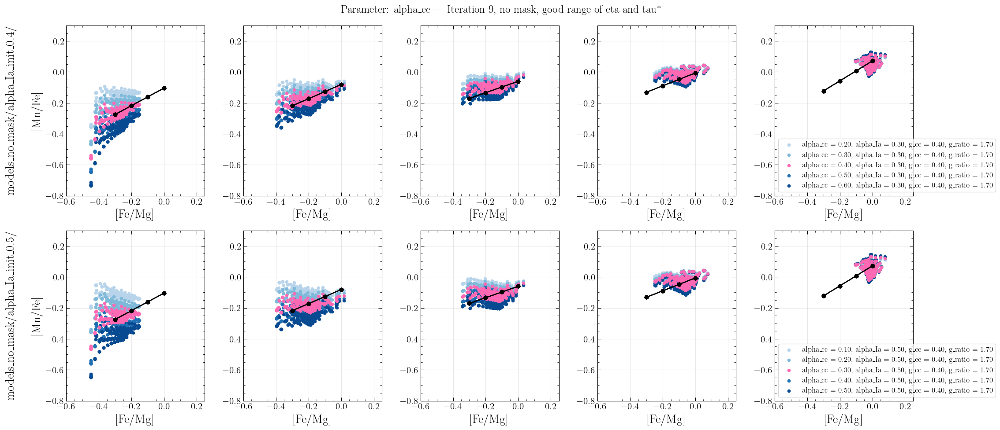

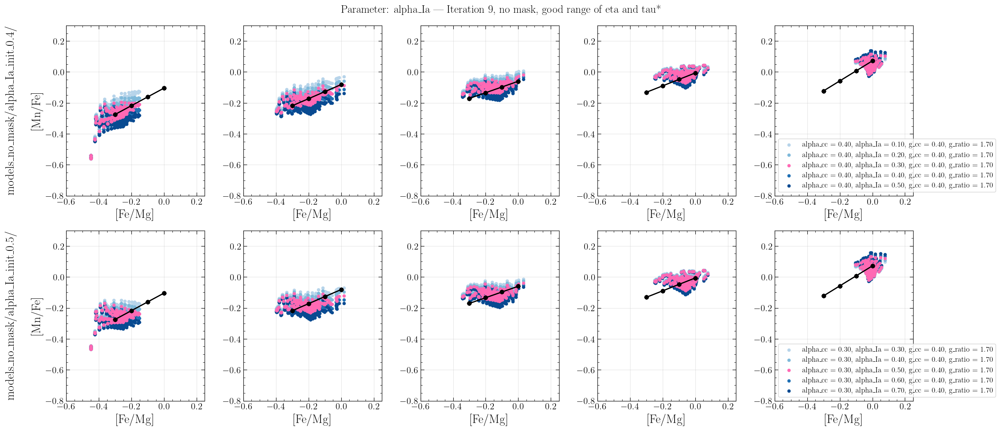

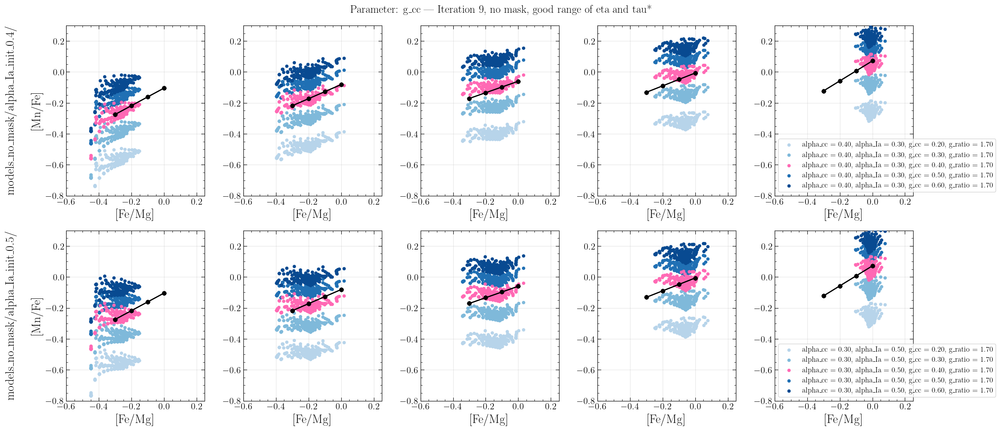

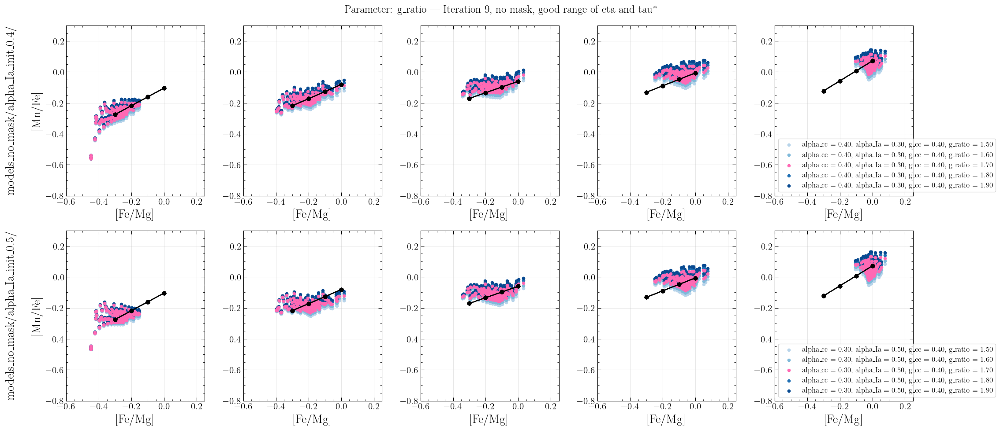

In [10]:
folders = [
    "models_no_mask/alpha_Ia_init_0.4/",
    "models_no_mask/alpha_Ia_init_0.5/",
]

plot_iteration_models(
    folders=folders,
    data=data,
    fe_mg_centers=fe_mg_centers,
    iter_num=9,
)

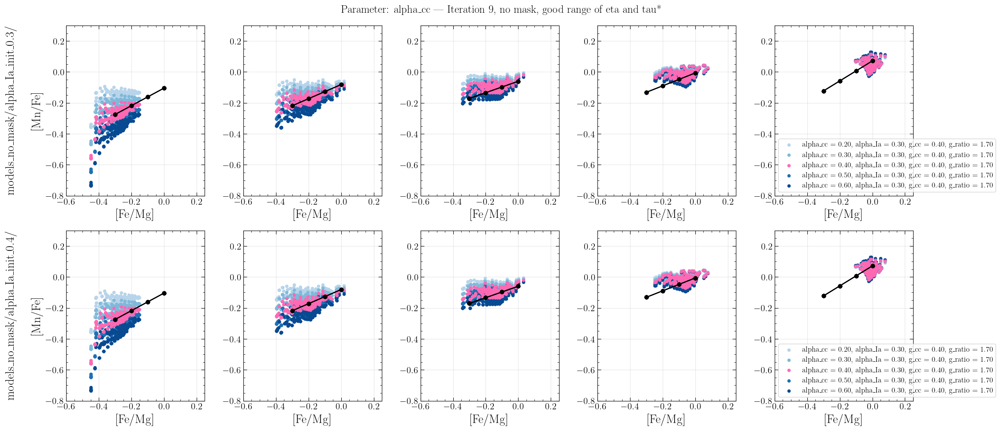

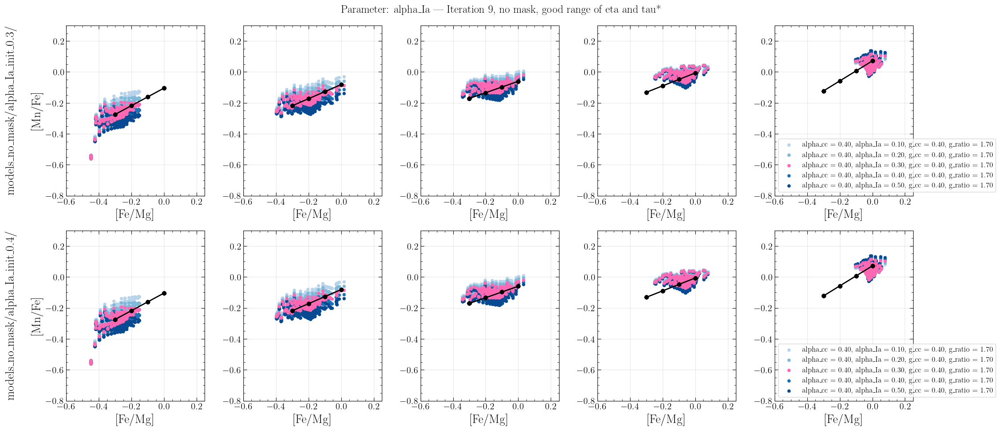

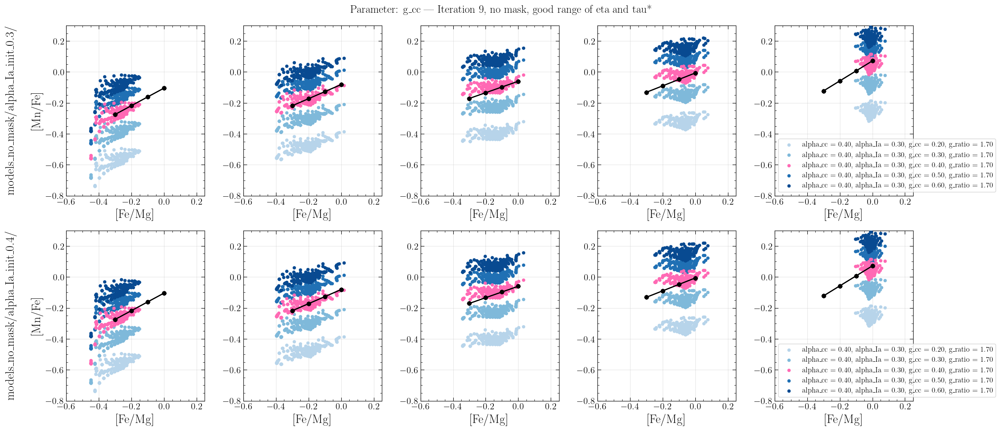

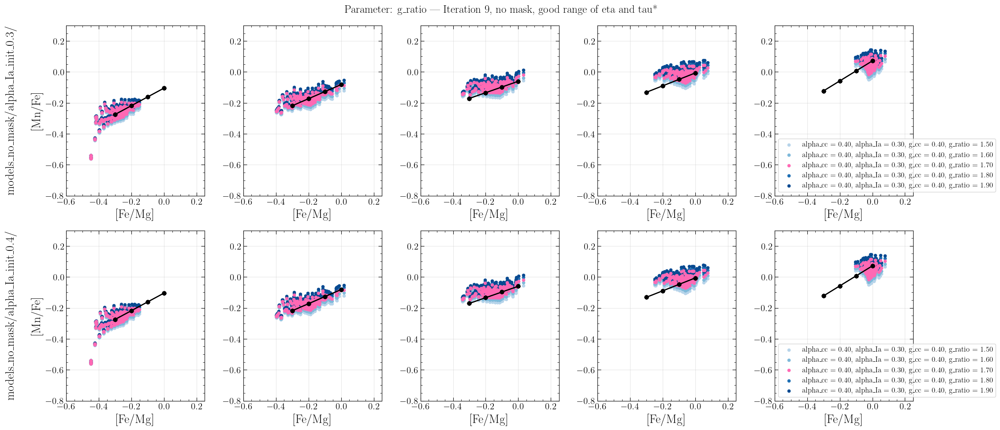

In [11]:
folders = [
    "models_no_mask/alpha_Ia_init_0.3/",
    "models_no_mask/alpha_Ia_init_0.4/",
]

plot_iteration_models(
    folders=folders,
    data=data,
    fe_mg_centers=fe_mg_centers,
    iter_num=9,
)

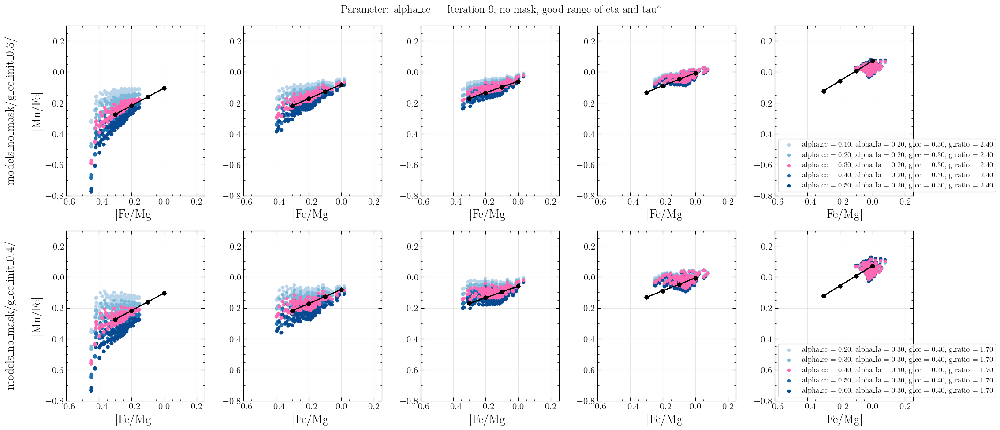

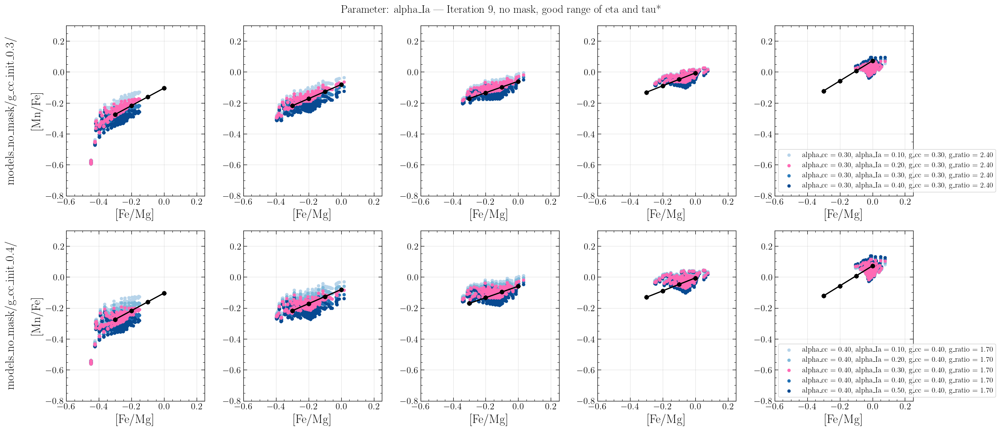

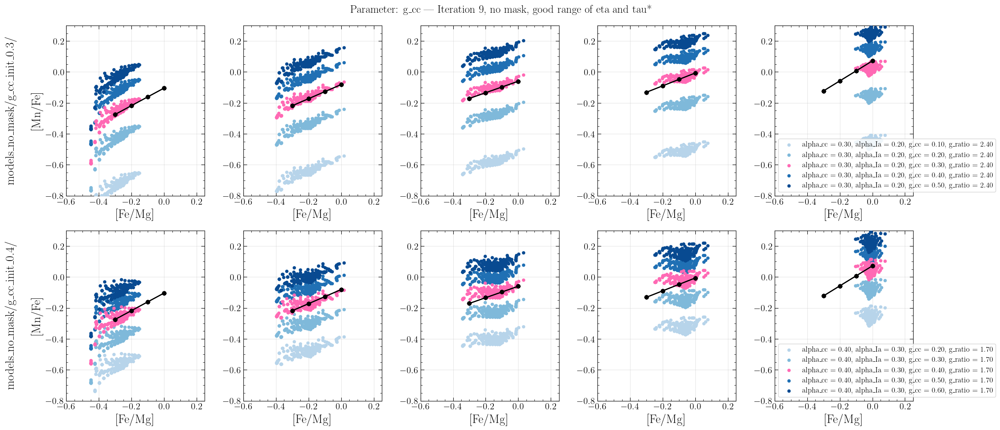

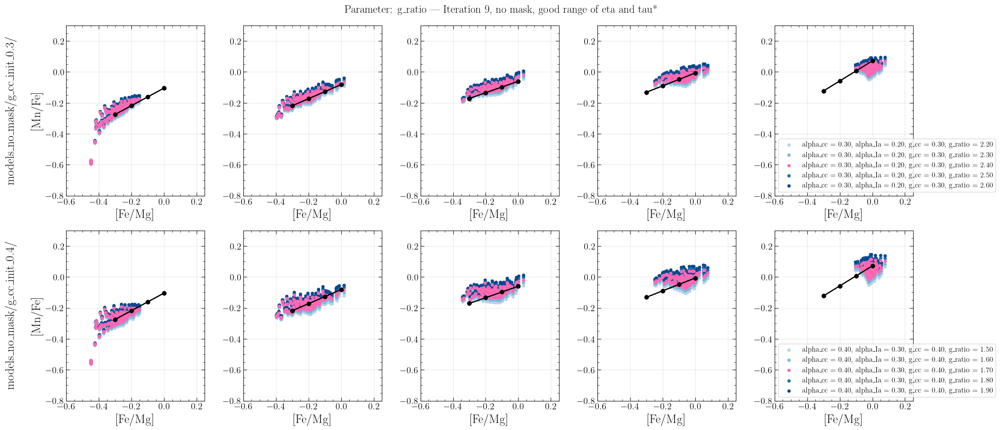

In [13]:
folders = [
    "models_no_mask/g_cc_init_0.3/",
    "models_no_mask/g_cc_init_0.4/",
]

plot_iteration_models(
    folders=folders,
    data=data,
    fe_mg_centers=fe_mg_centers,
    iter_num=9,
)

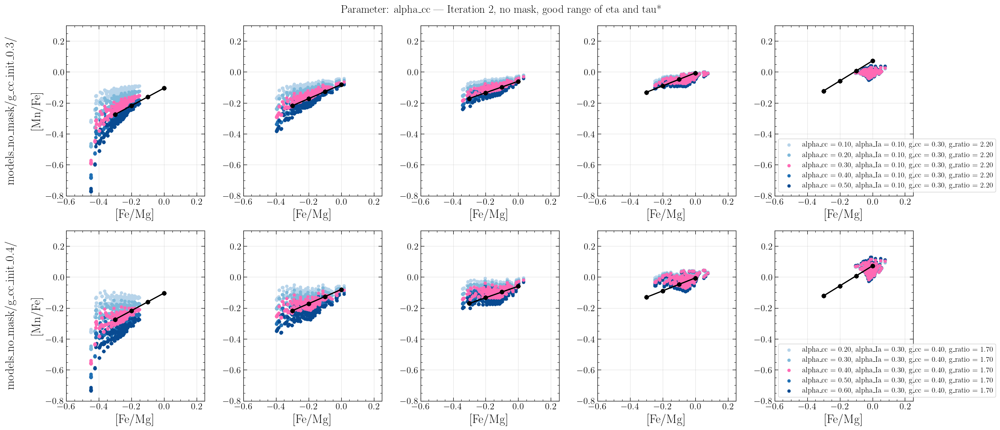

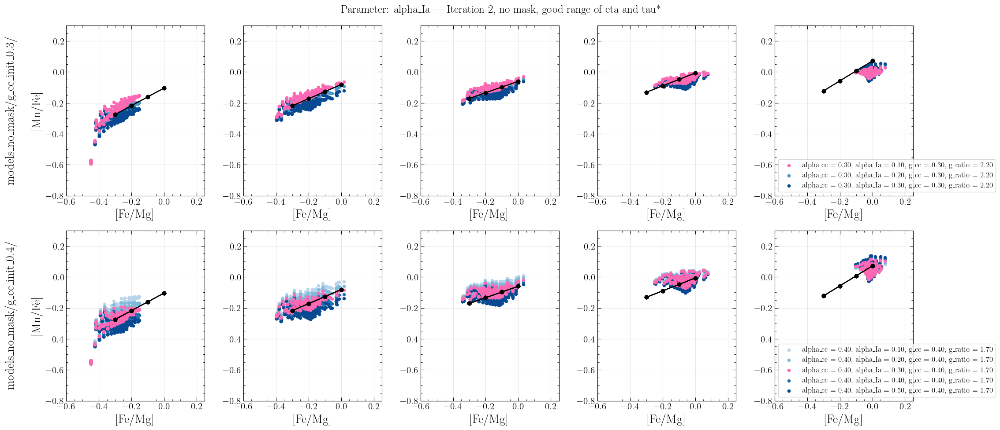

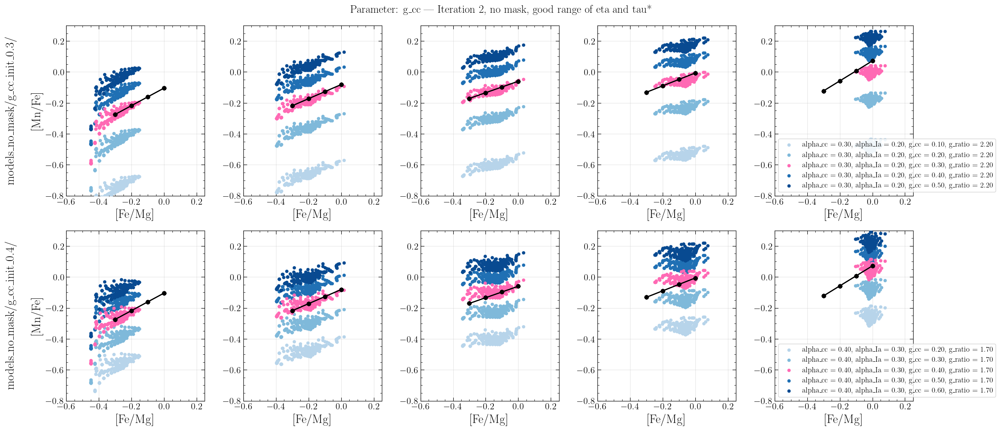

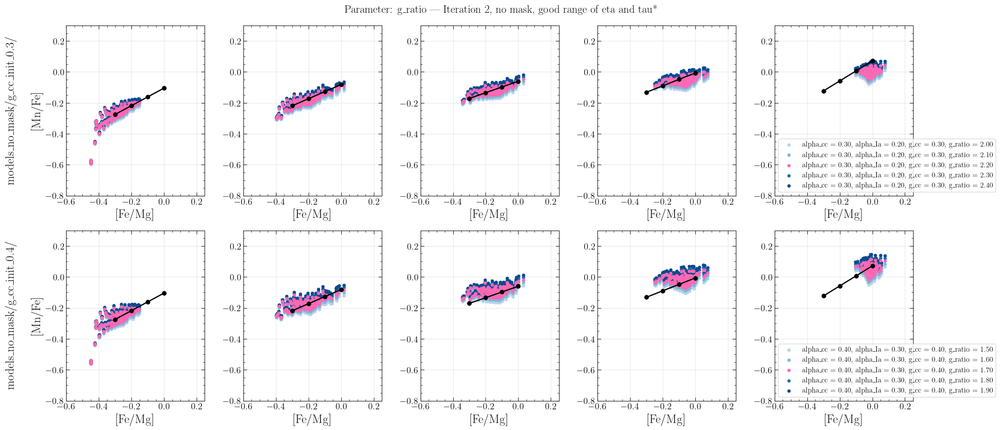

In [17]:
folders = [
    "models_no_mask/g_cc_init_0.3/",
    "models_no_mask/g_cc_init_0.4/",
]

plot_iteration_models(
    folders=folders,
    data=data,
    fe_mg_centers=fe_mg_centers,
    iter_num=2,
)

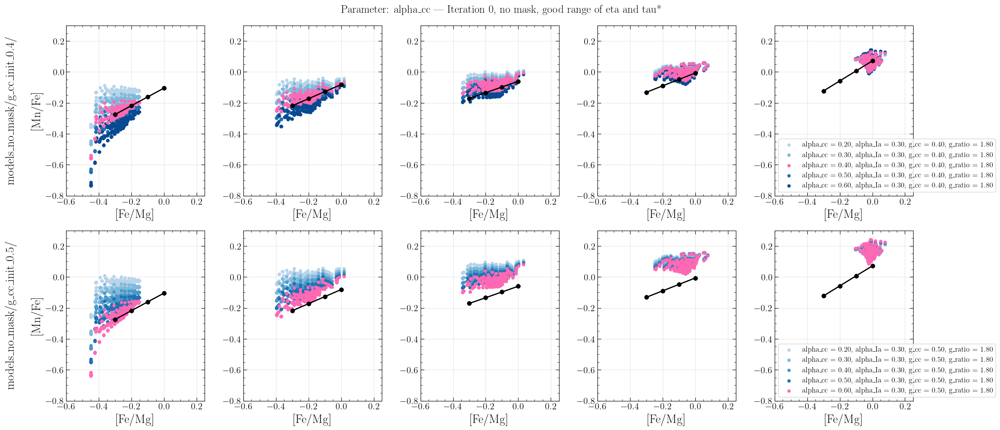

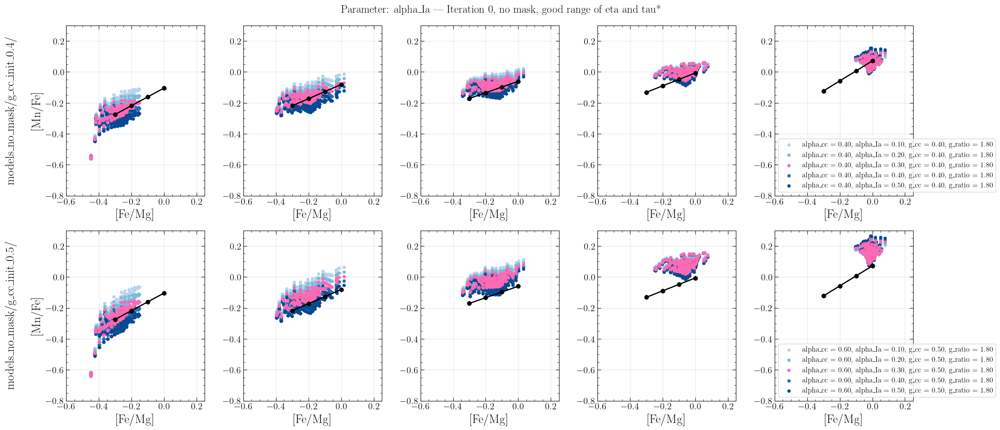

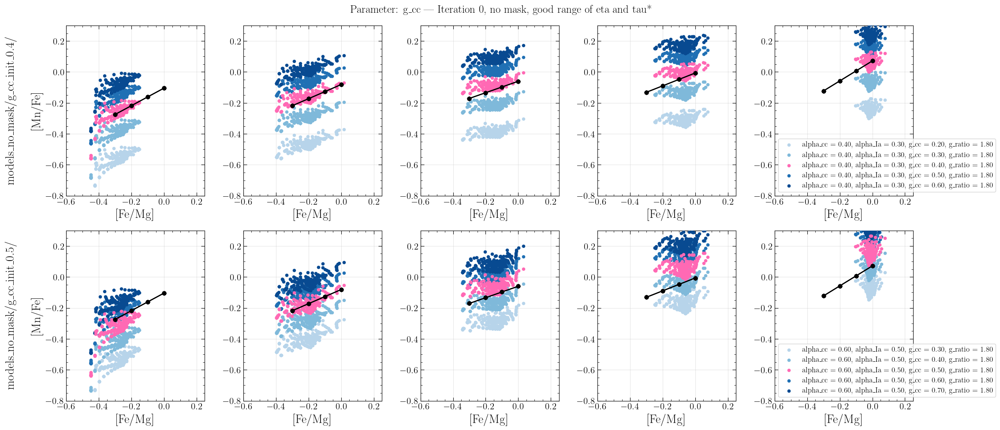

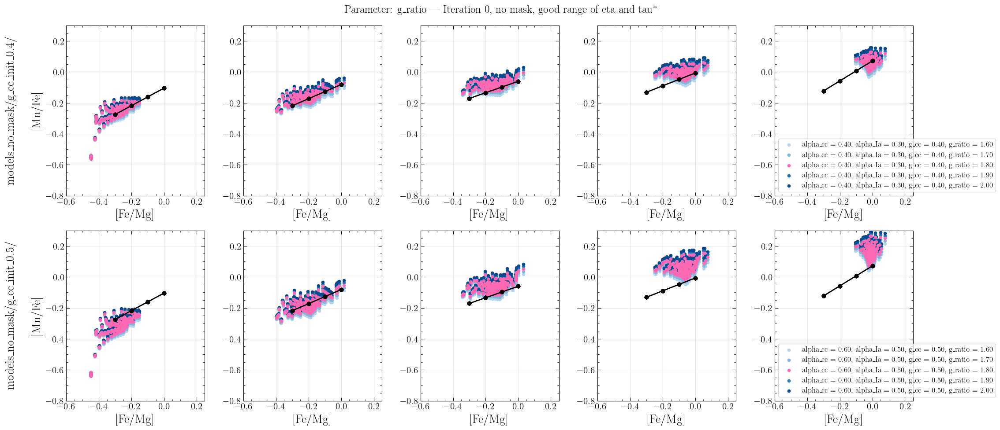

In [19]:
folders = [
    "models_no_mask/g_cc_init_0.4/",
    "models_no_mask/g_cc_init_0.5/",
]

plot_iteration_models(
    folders=folders,
    data=data,
    fe_mg_centers=fe_mg_centers,
    iter_num=0,
)

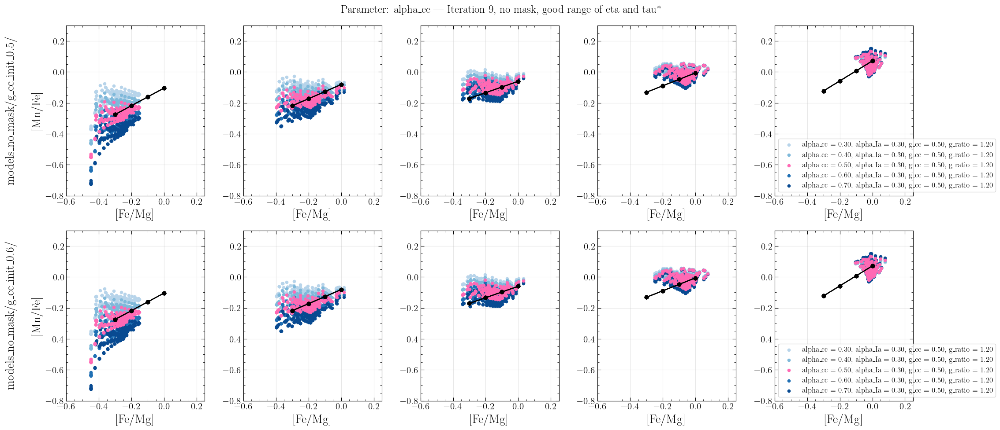

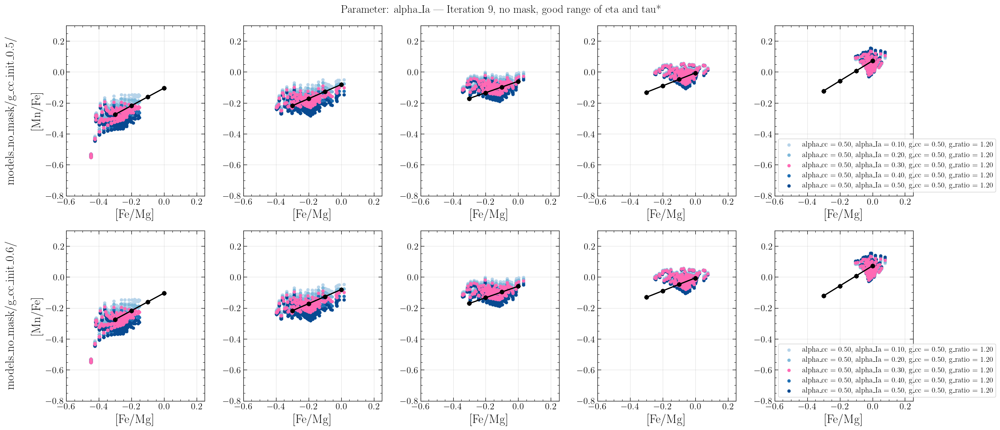

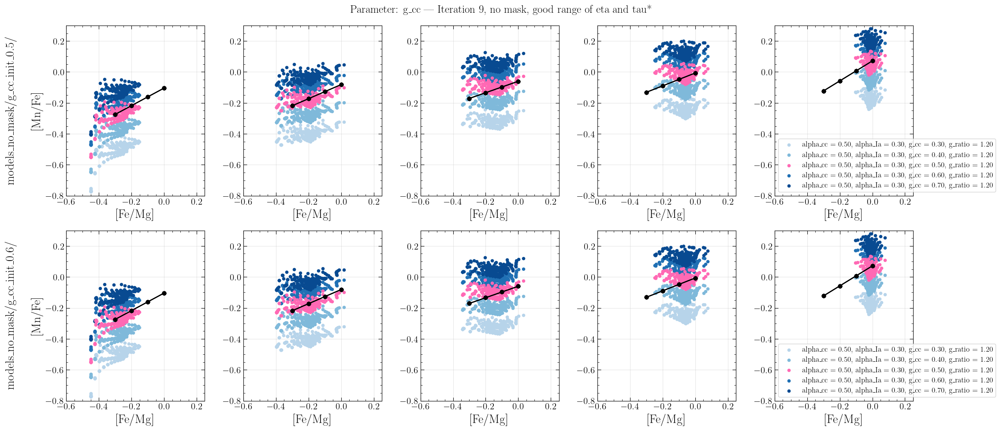

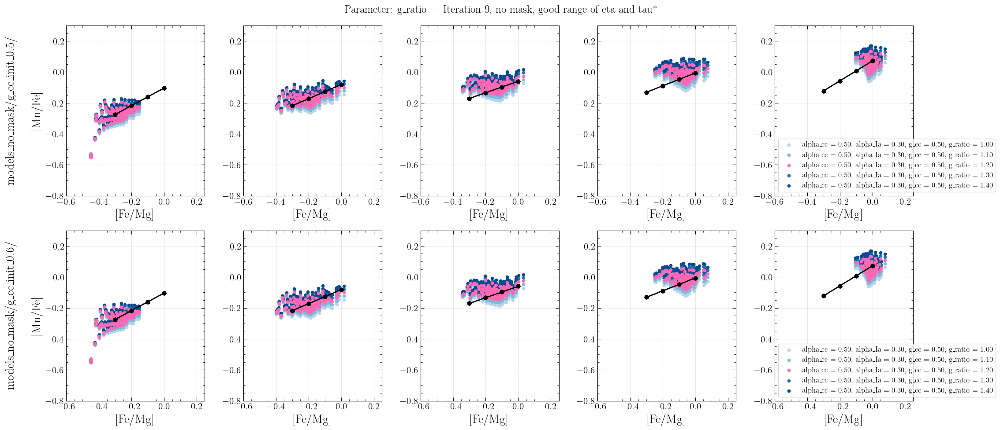

In [21]:
folders = [
    "models_no_mask/g_cc_init_0.5/",
    "models_no_mask/g_cc_init_0.6/",
]

plot_iteration_models(
    folders=folders,
    data=data,
    fe_mg_centers=fe_mg_centers,
    iter_num=9,
)

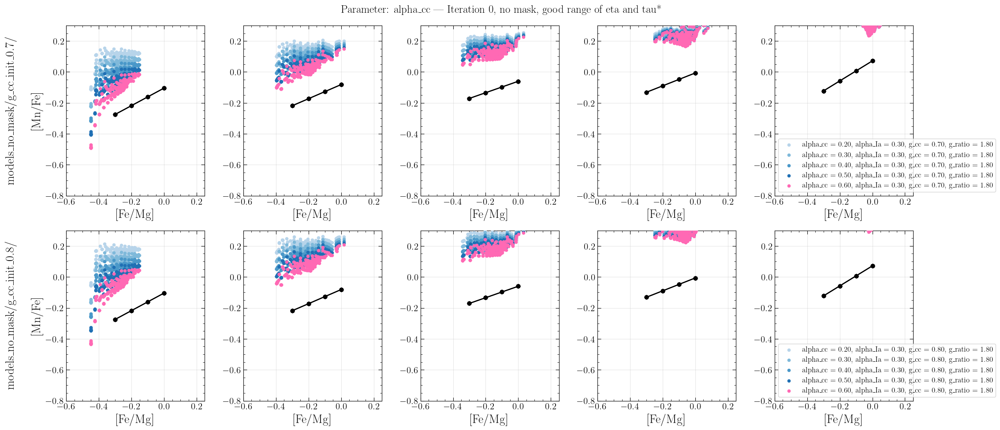

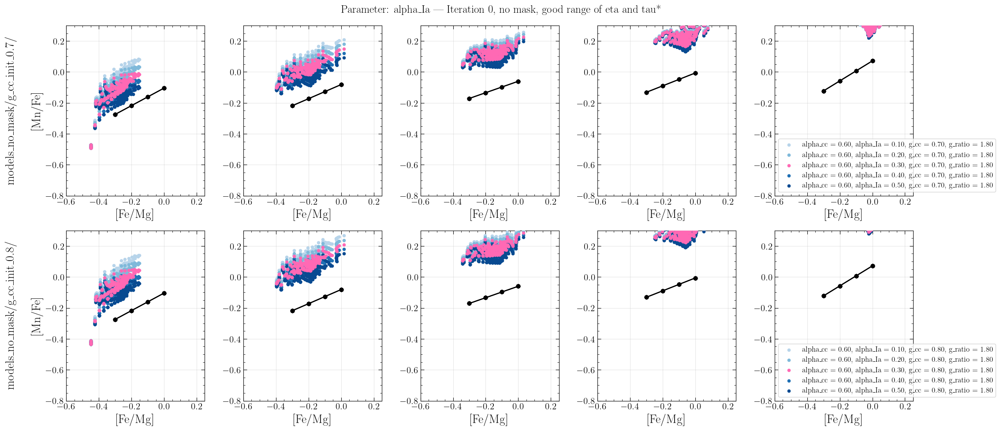

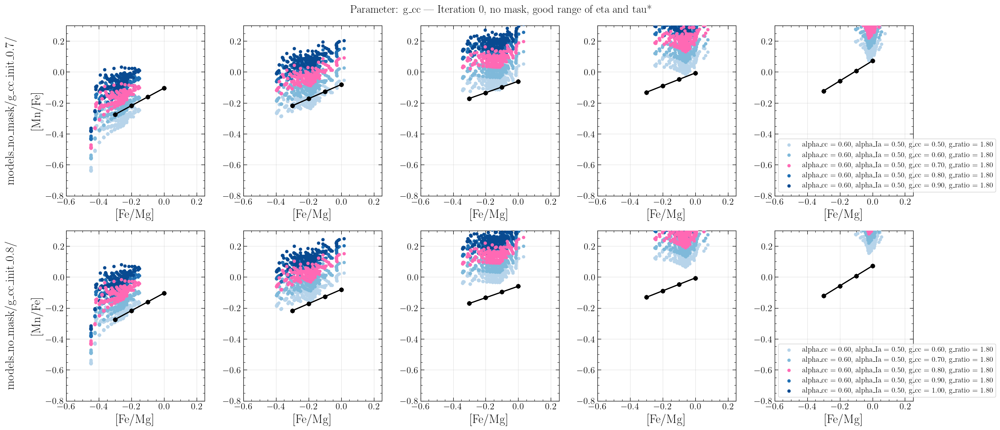

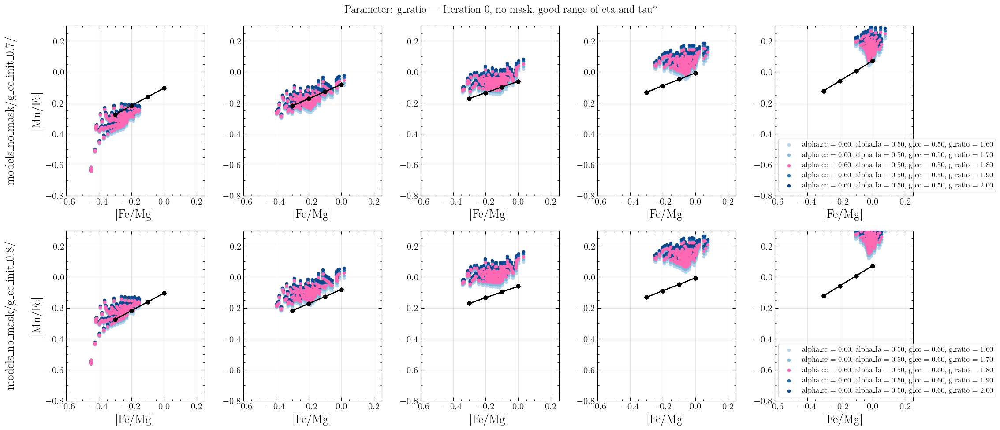

In [23]:
folders = [
    "models_no_mask/g_cc_init_0.7/",
    "models_no_mask/g_cc_init_0.8/",
]

plot_iteration_models(
    folders=folders,
    data=data,
    fe_mg_centers=fe_mg_centers,
    iter_num=0,
)

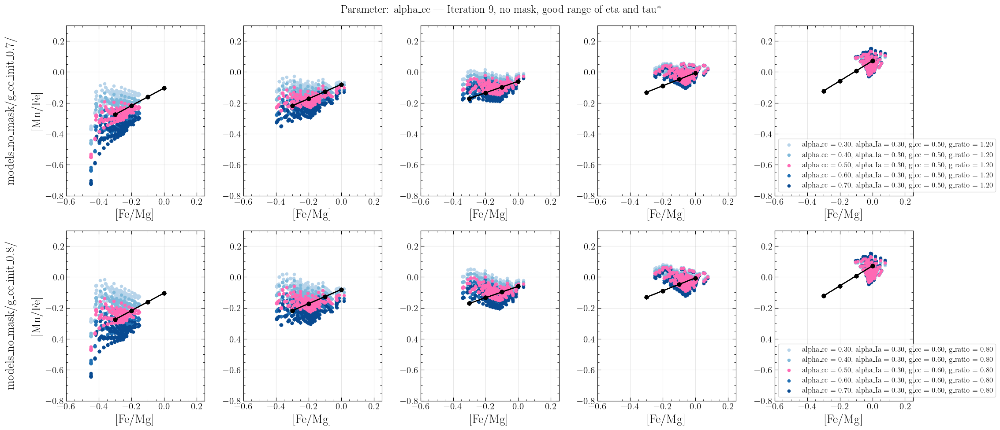

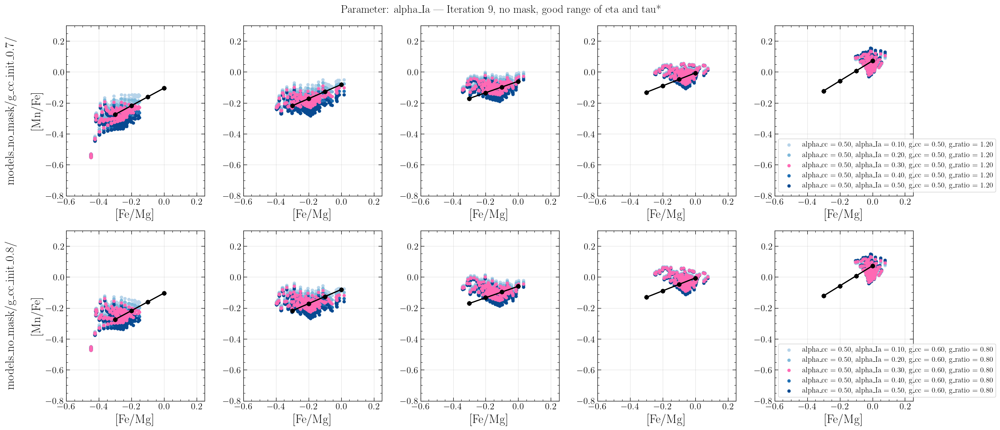

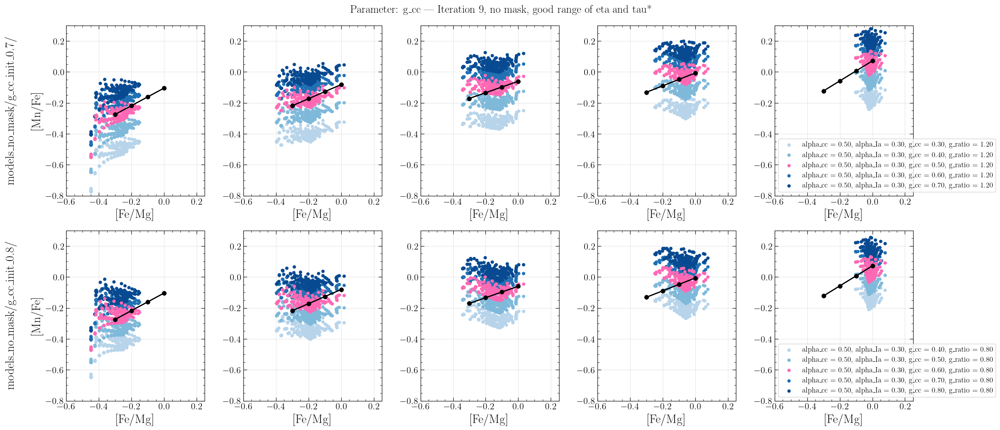

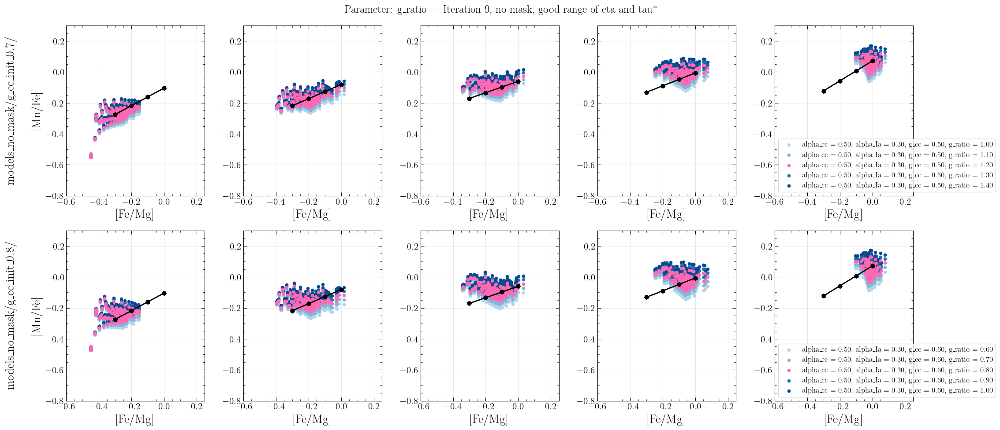

In [ ]:
folders = [
    "models_no_mask/g_cc_init_0.7/",
    "models_no_mask/g_cc_init_0.8/",
] 

plot_iteration_models(
    folders=folders,
    data=data,
    fe_mg_centers=fe_mg_centers,
    iter_num=9,
)

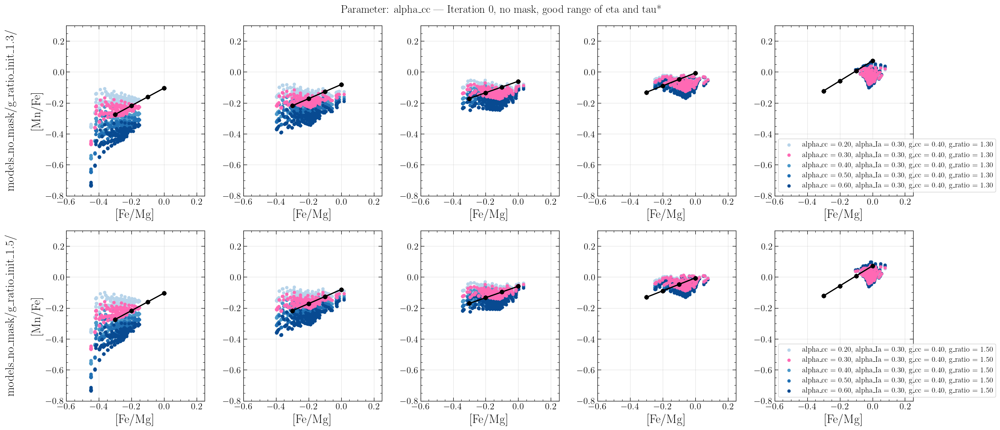

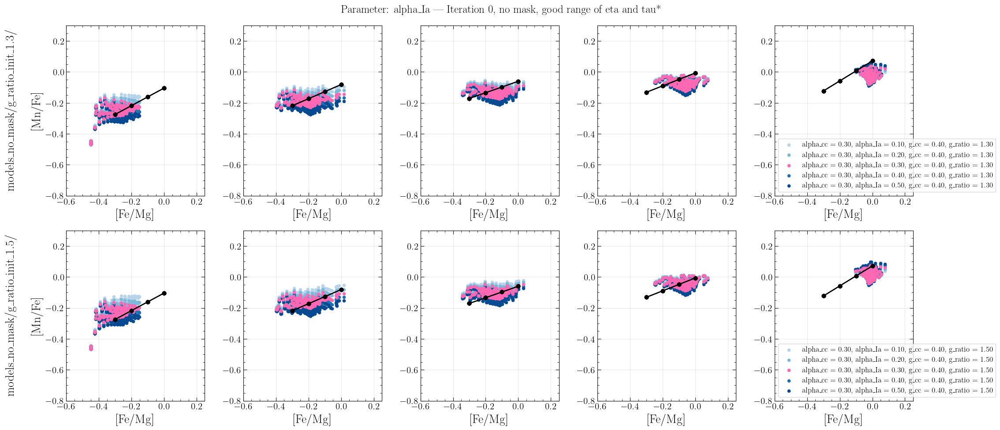

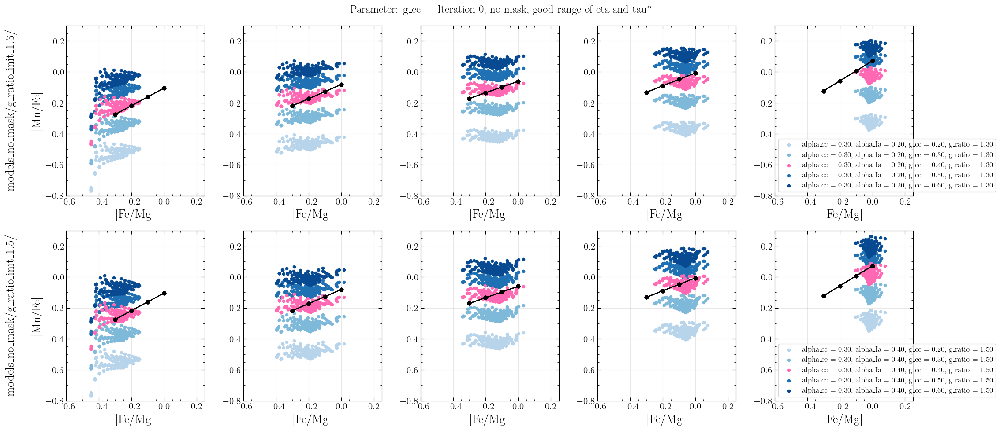

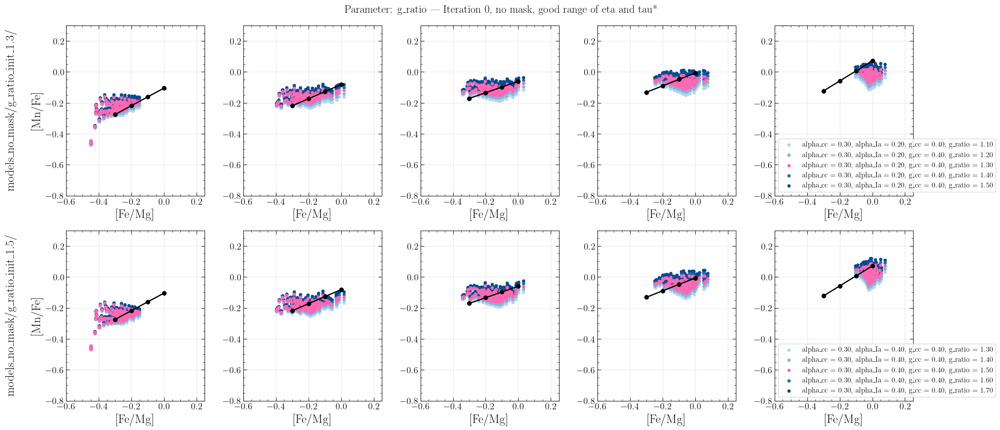

In [33]:
folders = [
    "models_no_mask/g_ratio_init_1.3/",
    "models_no_mask/g_ratio_init_1.5/",
] 

plot_iteration_models(
    folders=folders,
    data=data,
    fe_mg_centers=fe_mg_centers,
    iter_num=0,
)

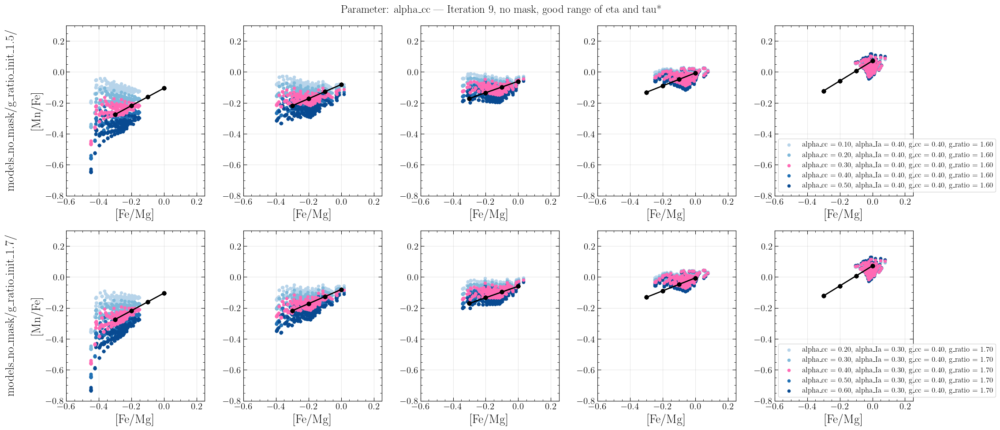

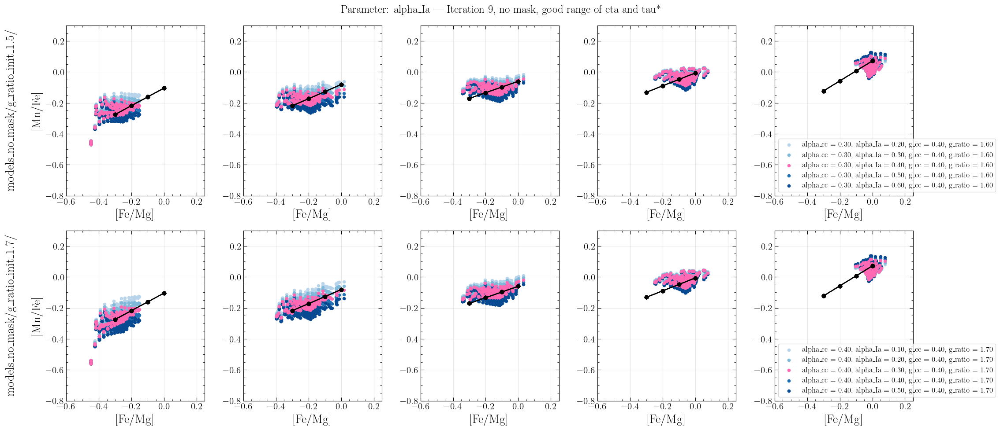

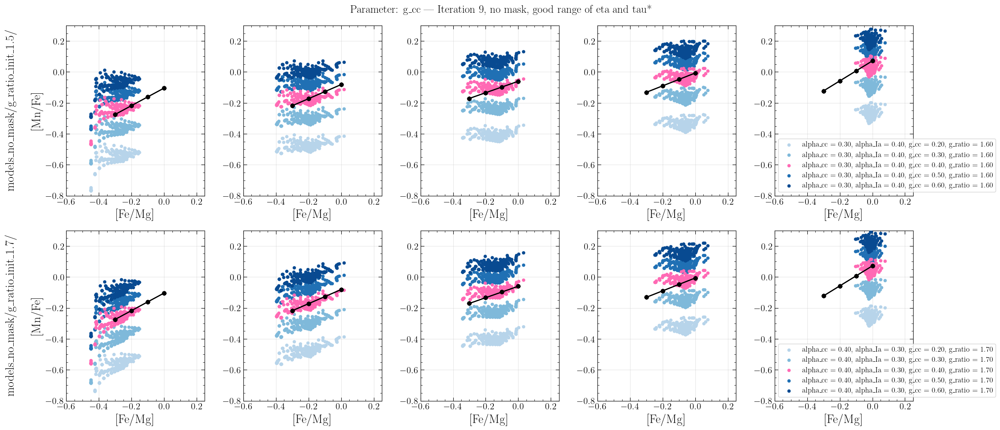

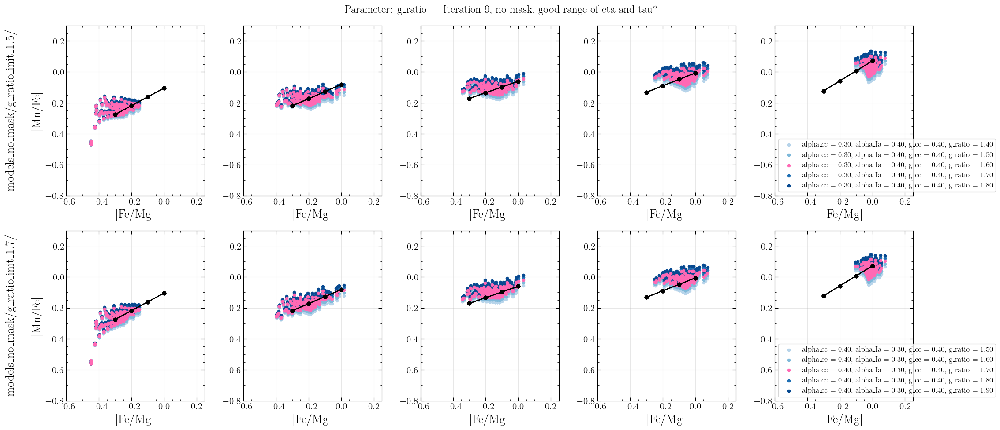

In [35]:
folders = [
    "models_no_mask/g_ratio_init_1.5/",
    "models_no_mask/g_ratio_init_1.7/",
] 

plot_iteration_models(
    folders=folders,
    data=data,
    fe_mg_centers=fe_mg_centers,
    iter_num=9,
)

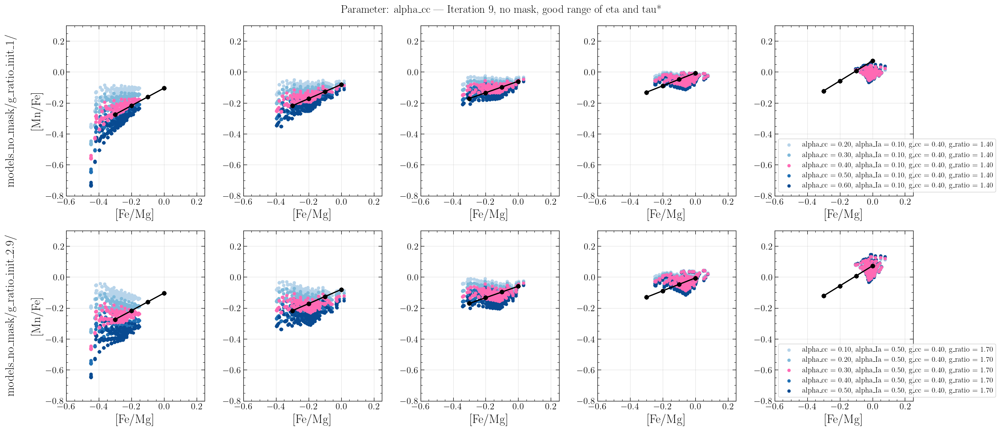

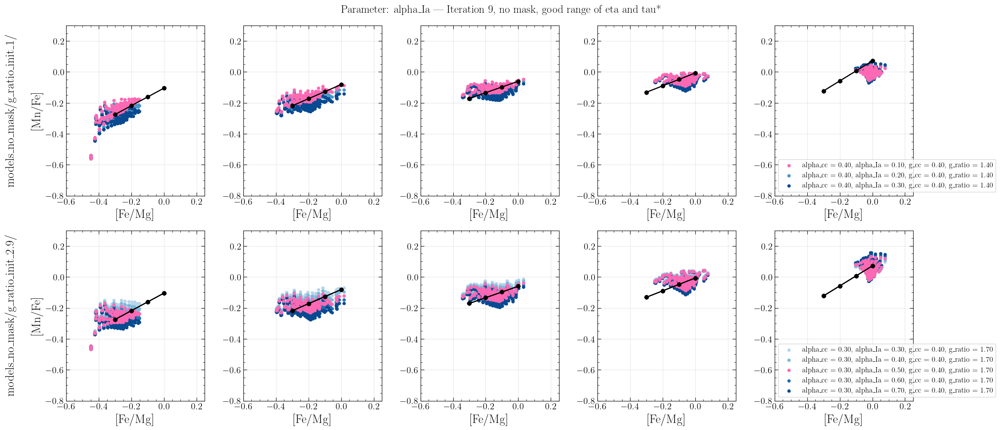

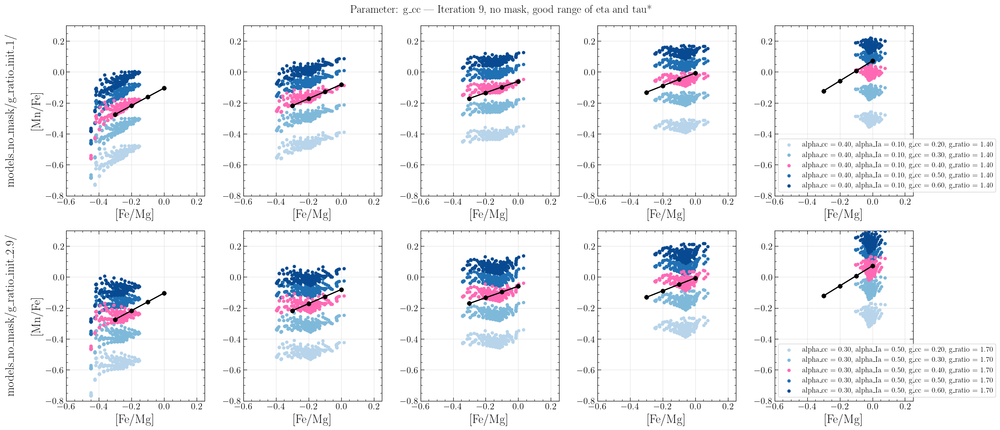

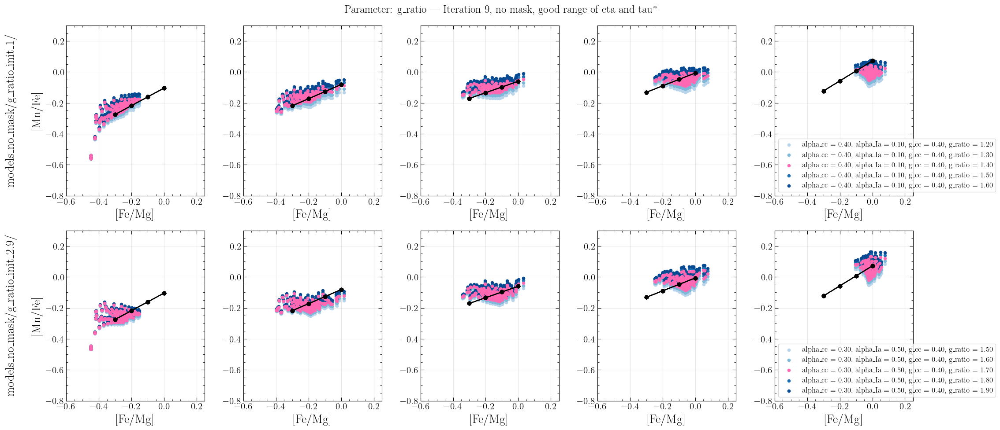

In [37]:
folders = [
    "models_no_mask/g_ratio_init_1/",
    "models_no_mask/g_ratio_init_2.9/",
] 

plot_iteration_models(
    folders=folders,
    data=data,
    fe_mg_centers=fe_mg_centers,
    iter_num=9,
)

In [5]:
best_alpha_cc_init_01 = pd.read_csv("models_no_mask/alpha_cc_init_0.1/best_parameters_per_iteration.csv")
best_alpha_cc_init_02 = pd.read_csv("models_no_mask/alpha_cc_init_0.2/best_parameters_per_iteration.csv")

In [6]:
best_alpha_cc_init_02

,iteration,best_alpha_cc,best_alpha_Ia,best_g_cc,best_g_ratio
0,0,0.4,0.3,0.4,1.8
1,0,0.4,0.3,0.4,1.8
2,0,0.4,0.3,0.4,1.8
3,0,0.4,0.3,0.4,1.7
4,1,0.4,0.3,0.4,1.7
5,1,0.4,0.3,0.4,1.7
6,1,0.4,0.3,0.4,1.7
7,1,0.4,0.3,0.4,1.7
8,2,0.4,0.3,0.4,1.7
9,2,0.4,0.3,0.4,1.7


In [40]:
best_alpha_cc_init_01

,iteration,best_alpha_cc,best_alpha_Ia,best_g_cc,best_g_ratio
0,0,0.3,0.3,0.4,1.8
1,0,0.3,0.5,0.4,1.8
2,0,0.3,0.5,0.4,1.8
3,0,0.3,0.5,0.4,1.7
4,1,0.3,0.5,0.4,1.7
5,1,0.3,0.5,0.4,1.7
6,1,0.3,0.5,0.4,1.7
7,1,0.3,0.5,0.4,1.7
8,2,0.3,0.5,0.4,1.7
9,2,0.3,0.5,0.4,1.7


In [7]:
import os
import glob
import pandas as pd

base_dir = "models_no_mask"
subdirs = glob.glob(os.path.join(base_dir, "alpha_cc_init_*"))

summary_records = []

for folder in subdirs:
    csv_path = os.path.join(folder, "best_parameters_per_iteration.csv")
    
    if os.path.exists(csv_path):
        df = pd.read_csv(csv_path)
        
        # Extract the initial alpha_cc value from the folder name
        folder_name = os.path.basename(folder)
        alpha_cc_init_str = folder_name.replace("alpha_cc_init_", "")
        alpha_cc_init = float(alpha_cc_init_str)
        
        # Initial alpha_Ia is the value in the very first row
        first_row = df.iloc[0]
        alpha_Ia_init = first_row['best_alpha_Ia']
        
        # Final optimized values are from the last row
        last_row = df.iloc[-1]
        final_best_alpha_cc = last_row['best_alpha_cc']
        final_best_alpha_Ia = last_row['best_alpha_Ia']
        
        summary_records.append({
            'alpha_cc_init': alpha_cc_init,
            'alpha_Ia_init': alpha_Ia_init,
            'best_alpha_cc_final': final_best_alpha_cc,
            'best_alpha_Ia_final': final_best_alpha_Ia
        })

df_summary = pd.DataFrame(summary_records)
df_summary = df_summary.sort_values(by='alpha_cc_init').reset_index(drop=True)

In [8]:
df_summary

,alpha_cc_init,alpha_Ia_init,best_alpha_cc_final,best_alpha_Ia_final
0,0.1,0.3,0.3,0.5
1,0.2,0.3,0.4,0.3
2,0.3,0.3,0.4,0.3
3,0.4,0.3,0.4,0.3
4,0.5,0.3,0.4,0.3
5,0.6,0.3,0.4,0.3
6,0.7,0.3,0.4,0.3
7,0.8,0.3,0.4,0.3
8,0.9,0.3,0.4,0.3


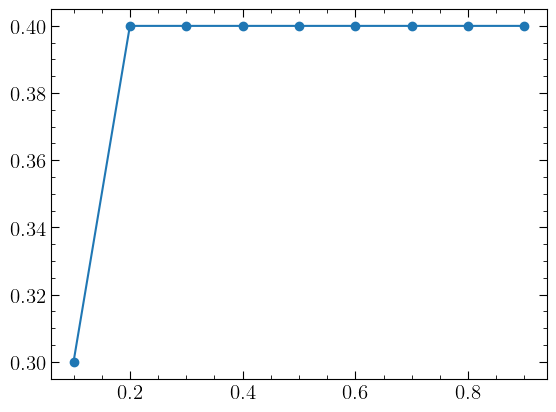

In [10]:
plt.plot(df_summary['alpha_cc_init'], df_summary['best_alpha_cc_final'], marker = 'o')

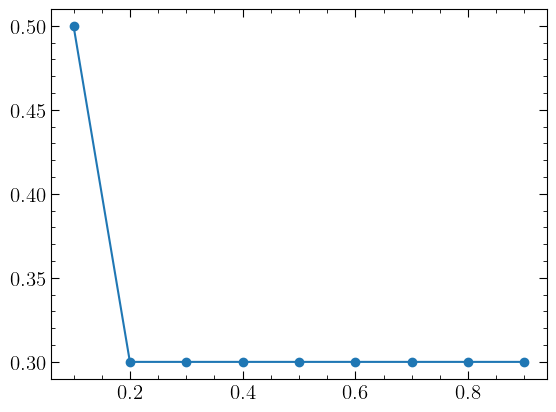

In [12]:
plt.plot(df_summary['alpha_cc_init'], df_summary['best_alpha_Ia_final'], marker = 'o')

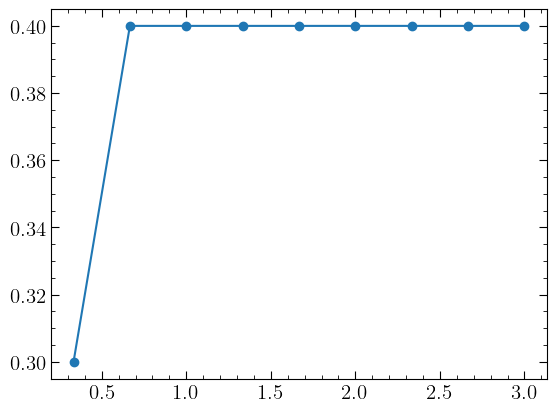

In [13]:
plt.plot(df_summary['alpha_cc_init']/df_summary['alpha_Ia_init'], df_summary['best_alpha_cc_final'], marker = 'o')

In [14]:
import os
import glob
import pandas as pd

base_dir = "models_no_mask"
subdirs = glob.glob(os.path.join(base_dir, "alpha_Ia_init_*"))

summary_records = []

for folder in subdirs:
    csv_path = os.path.join(folder, "best_parameters_per_iteration.csv")
    
    if os.path.exists(csv_path):
        df = pd.read_csv(csv_path)
        
        # Extract initial alpha_Ia from the folder name
        folder_name = os.path.basename(folder)
        alpha_Ia_init_str = folder_name.replace("alpha_Ia_init_", "")
        alpha_Ia_init = float(alpha_Ia_init_str)
        
        # Initial alpha_cc is the default value passed into the run
        alpha_cc_init = alpha_cc_def
        
        # Final optimized values from the last row
        last_row = df.iloc[-1]
        final_best_alpha_cc = last_row['best_alpha_cc']
        final_best_alpha_Ia = last_row['best_alpha_Ia']
        
        summary_records.append({
            'alpha_Ia_init': alpha_Ia_init,
            'alpha_cc_init': alpha_cc_init,
            'best_alpha_cc_final': final_best_alpha_cc,
            'best_alpha_Ia_final': final_best_alpha_Ia
        })

df_summary_alpha_Ia = pd.DataFrame(summary_records)
df_summary_alpha_Ia = df_summary_alpha_Ia.sort_values(by='alpha_Ia_init').reset_index(drop=True)

In [15]:
df_summary_alpha_Ia

,alpha_Ia_init,alpha_cc_init,best_alpha_cc_final,best_alpha_Ia_final
0,0.1,0.4,0.4,0.3
1,0.2,0.4,0.4,0.3
2,0.3,0.4,0.4,0.3
3,0.4,0.4,0.4,0.3
4,0.5,0.4,0.3,0.5
5,0.6,0.4,0.3,0.5
6,0.7,0.4,0.3,0.5
7,0.8,0.4,0.2,0.8
8,0.9,0.4,0.2,0.8


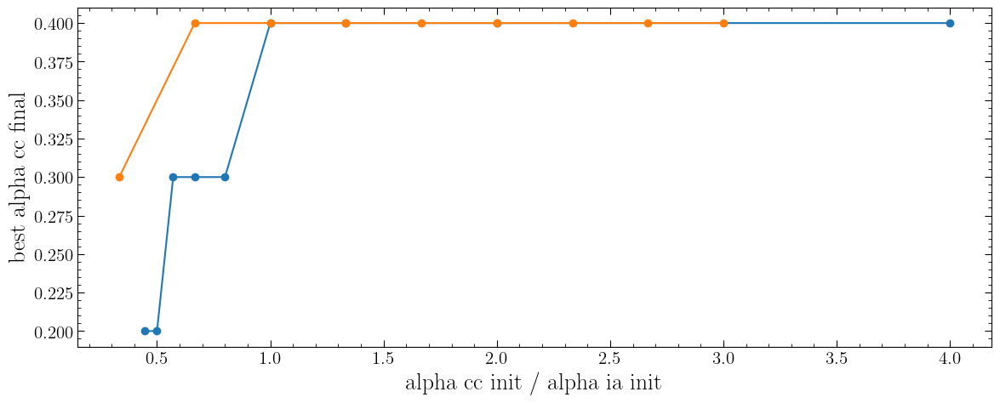

In [22]:
plt.figure(figsize=(12,5))
plt.plot(df_summary_alpha_Ia['alpha_cc_init']/df_summary_alpha_Ia['alpha_Ia_init'], df_summary_alpha_Ia['best_alpha_cc_final'], marker = 'o')
plt.plot(df_summary['alpha_cc_init']/df_summary['alpha_Ia_init'], df_summary['best_alpha_cc_final'], marker = 'o')

plt.ylabel('best alpha cc final')
plt.xlabel('alpha cc init / alpha ia init')
plt.tight_layout()

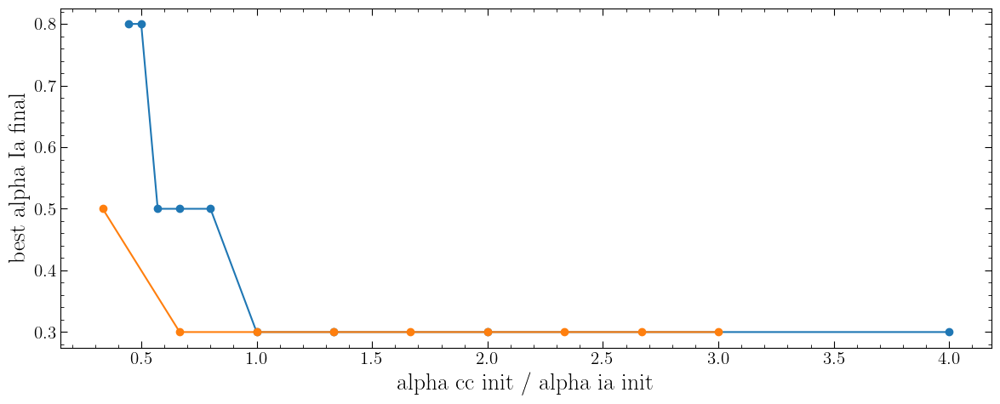

In [23]:
plt.figure(figsize=(12,5))
plt.plot(df_summary_alpha_Ia['alpha_cc_init']/df_summary_alpha_Ia['alpha_Ia_init'], df_summary_alpha_Ia['best_alpha_Ia_final'], marker = 'o')
plt.plot(df_summary['alpha_cc_init']/df_summary['alpha_Ia_init'], df_summary['best_alpha_Ia_final'], marker = 'o')

plt.ylabel('best alpha Ia final')
plt.xlabel('alpha cc init / alpha ia init')
plt.tight_layout()

In [21]:
import os
import re
import glob
import pandas as pd
import numpy as np

base_dir = "models_no_mask"
chi2_files = sorted(glob.glob(os.path.join(base_dir, "*", "chi_2_results_*_iter_9.csv")))

records = []

for fpath in chi2_files:
    df = pd.read_csv(fpath)

    for _, row in df.iterrows():
        file_str = row["file"]

        # parse init and opt from the row-level file name
        m_init = re.search(r"(alpha_cc|alpha_Ia|g_cc|g_ratio)_init_([-+]?\d*\.?\d+(?:[eE][-+]?\d+)?)", file_str)
        m_opt = re.search(r"(alpha_cc|alpha_Ia|g_cc|g_ratio)_iter\d+_", os.path.basename(file_str))

        init_param = m_init.group(1) if m_init else np.nan
        init_value = float(m_init.group(2)) if m_init else np.nan
        opt_param = m_opt.group(1) if m_opt else np.nan

        records.append({
            "source_csv": fpath,
            "file": file_str,
            "alpha_cc": row["alpha_cc"],
            "alpha_Ia": row["alpha_Ia"],
            "g_cc": row["g_cc"],
            "g_ratio": row["g_ratio"],
            "Upsilon": row["Upsilon"],
            "Chi_2_sum": row["chi_2_sum"],
            "reduced_chi2": row["reduced_chi2"],
            "n_points": row["n_points"],
            "init_param": init_param,
            "init_value": init_value,
            "opt_param": opt_param,
        })

df_summary_chi2 = pd.DataFrame(records)

df_summary_chi2["best_or_not"] = (
    df_summary_chi2.groupby("source_csv")["reduced_chi2"]
    .transform(lambda x: (x == x.min()).astype(int))
)

In [22]:
df_summary_chi2

,source_csv,file,alpha_cc,alpha_Ia,g_cc,g_ratio,Upsilon,Chi_2_sum,reduced_chi2,n_points,init_param,init_value,opt_param,best_or_not
0,models_no_mask/alpha_Ia_init_0.1/chi_2_results...,models_no_mask/alpha_Ia_init_0.1/alpha_Ia_iter...,0.4,0.5,0.4,1.7,1,3.682988,0.027081,136,alpha_Ia,0.1,alpha_Ia,0
1,models_no_mask/alpha_Ia_init_0.1/chi_2_results...,models_no_mask/alpha_Ia_init_0.1/alpha_Ia_iter...,0.4,0.1,0.4,1.7,1,4.194544,0.030842,136,alpha_Ia,0.1,alpha_Ia,0
2,models_no_mask/alpha_Ia_init_0.1/chi_2_results...,models_no_mask/alpha_Ia_init_0.1/alpha_Ia_iter...,0.4,0.3,0.4,1.7,1,1.995763,0.014675,136,alpha_Ia,0.1,alpha_Ia,1
3,models_no_mask/alpha_Ia_init_0.1/chi_2_results...,models_no_mask/alpha_Ia_init_0.1/alpha_Ia_iter...,0.4,0.4,0.4,1.7,1,2.469644,0.018159,136,alpha_Ia,0.1,alpha_Ia,0
4,models_no_mask/alpha_Ia_init_0.1/chi_2_results...,models_no_mask/alpha_Ia_init_0.1/alpha_Ia_iter...,0.4,0.2,0.4,1.7,1,2.484027,0.018265,136,alpha_Ia,0.1,alpha_Ia,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
746,models_no_mask/g_ratio_init_2.9/chi_2_results_...,models_no_mask/g_ratio_init_2.9/g_ratio_iter9_...,0.3,0.5,0.4,1.9,1,2.699261,0.019848,136,g_ratio,2.9,g_ratio,0
747,models_no_mask/g_ratio_init_2.9/chi_2_results_...,models_no_mask/g_ratio_init_2.9/g_ratio_iter9_...,0.3,0.5,0.4,1.5,1,2.996318,0.022032,136,g_ratio,2.9,g_ratio,0
748,models_no_mask/g_ratio_init_2.9/chi_2_results_...,models_no_mask/g_ratio_init_2.9/g_ratio_iter9_...,0.3,0.5,0.4,1.7,1,2.220997,0.016331,136,g_ratio,2.9,g_ratio,1
749,models_no_mask/g_ratio_init_2.9/chi_2_results_...,models_no_mask/g_ratio_init_2.9/g_ratio_iter9_...,0.3,0.5,0.4,1.8,1,2.317302,0.017039,136,g_ratio,2.9,g_ratio,0


In [23]:
df_summary_chi2_best = df_summary_chi2[df_summary_chi2['best_or_not'] == 1]
df_summary_chi2_best

,source_csv,file,alpha_cc,alpha_Ia,g_cc,g_ratio,Upsilon,Chi_2_sum,reduced_chi2,n_points,init_param,init_value,opt_param,best_or_not
2,models_no_mask/alpha_Ia_init_0.1/chi_2_results...,models_no_mask/alpha_Ia_init_0.1/alpha_Ia_iter...,0.4,0.3,0.4,1.7,1,1.995763,0.014675,136,alpha_Ia,0.1,alpha_Ia,1
8,models_no_mask/alpha_Ia_init_0.1/chi_2_results...,models_no_mask/alpha_Ia_init_0.1/alpha_cc_iter...,0.4,0.3,0.4,1.7,1,1.995763,0.014675,136,alpha_Ia,0.1,alpha_cc,1
10,models_no_mask/alpha_Ia_init_0.1/chi_2_results...,models_no_mask/alpha_Ia_init_0.1/g_cc_iter9_0....,0.4,0.3,0.4,1.7,1,1.995763,0.014675,136,alpha_Ia,0.1,g_cc,1
17,models_no_mask/alpha_Ia_init_0.1/chi_2_results...,models_no_mask/alpha_Ia_init_0.1/g_ratio_iter9...,0.4,0.3,0.4,1.7,1,1.995763,0.014675,136,alpha_Ia,0.1,g_ratio,1
22,models_no_mask/alpha_Ia_init_0.2/chi_2_results...,models_no_mask/alpha_Ia_init_0.2/alpha_Ia_iter...,0.4,0.3,0.4,1.7,1,1.995763,0.014675,136,alpha_Ia,0.2,alpha_Ia,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
728,models_no_mask/g_ratio_init_2.7/chi_2_results_...,models_no_mask/g_ratio_init_2.7/g_ratio_iter9_...,0.3,0.5,0.4,1.7,1,2.220997,0.016331,136,g_ratio,2.7,g_ratio,1
732,models_no_mask/g_ratio_init_2.9/chi_2_results_...,models_no_mask/g_ratio_init_2.9/alpha_Ia_iter9...,0.3,0.5,0.4,1.7,1,2.220997,0.016331,136,g_ratio,2.9,alpha_Ia,1
738,models_no_mask/g_ratio_init_2.9/chi_2_results_...,models_no_mask/g_ratio_init_2.9/alpha_cc_iter9...,0.3,0.5,0.4,1.7,1,2.220997,0.016331,136,g_ratio,2.9,alpha_cc,1
741,models_no_mask/g_ratio_init_2.9/chi_2_results_...,models_no_mask/g_ratio_init_2.9/g_cc_iter9_0.4...,0.3,0.5,0.4,1.7,1,2.220997,0.016331,136,g_ratio,2.9,g_cc,1


In [60]:
df_summary_chi2_best['color_alpha_cc'] = ''

/var/folders/g0/fl404sj151l2v9xcdkjz9fq80000gn/T/ipykernel_34447/2374344800.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_summary_chi2_best['color_alpha_cc'] = ''


In [62]:
df_summary_chi2_best['alpha_cc'].unique()

array([0.4, 0.4, 0.3, 0.2, 0.4, 0.5, 0.3])

In [75]:
colors = []

for i in range(len(df_summary_chi2_best)):
    val = df_summary_chi2_best['alpha_cc'].iloc[i]
    
    if np.isclose(val, 0.2):
        colors.append('navy')
    elif np.isclose(val, 0.3):
        colors.append('cornflowerblue')
    elif np.isclose(val, 0.4):
        colors.append('orange')
    elif np.isclose(val, 0.5):
        colors.append('magenta')
    else:
        colors.append('gray')  # fallback for other values

df_summary_chi2_best['color_alpha_cc'] = colors

/var/folders/g0/fl404sj151l2v9xcdkjz9fq80000gn/T/ipykernel_34447/2376784123.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_summary_chi2_best['color_alpha_cc'] = colors


In [76]:
df_summary_init_param_alpha_cc = df_summary_chi2_best[df_summary_chi2_best['init_param'] == "alpha_cc"]
df_summary_init_param_alpha_Ia = df_summary_chi2_best[df_summary_chi2_best['init_param'] == "alpha_Ia"]

In [77]:
df_summary_init_param_alpha_cc['alpha_cc'].unique()

array([0.3, 0.4, 0.4, 0.4])

In [78]:
df_summary_init_param_alpha_cc['alpha_Ia'].unique()

array([0.5, 0.3, 0.3])

In [79]:
df_summary_init_param_alpha_Ia['alpha_cc'].unique()

array([0.4, 0.4, 0.3, 0.2])

In [80]:
df_summary_init_param_alpha_Ia['alpha_Ia'].unique()

array([0.3, 0.5, 0.5, 0.8])

In [81]:
df_summary_init_param_alpha_cc['color_alpha_cc']

179    cornflowerblue
185    cornflowerblue
188    cornflowerblue
195    cornflowerblue
200            orange
206            orange
208            orange
215            orange
220            orange
226            orange
228            orange
235            orange
240            orange
246            orange
248            orange
255            orange
260            orange
266            orange
268            orange
275            orange
280            orange
286            orange
288            orange
295            orange
300            orange
306            orange
308            orange
315            orange
320            orange
326            orange
328            orange
335            orange
340            orange
346            orange
348            orange
355            orange
Name: color_alpha_cc, dtype: object

Text(0, 0.5, 'min reduced chi2 in iteration 9')

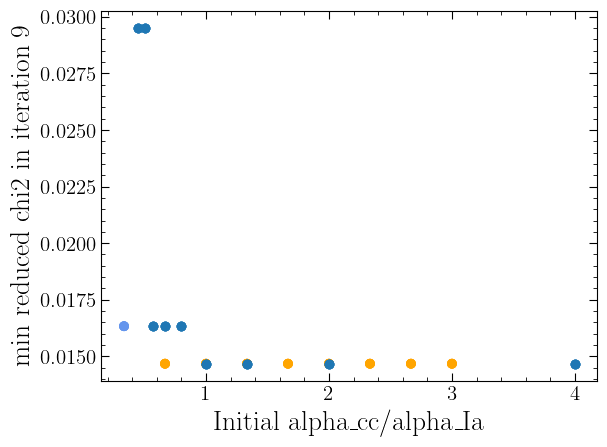

In [82]:
plt.scatter(df_summary_init_param_alpha_cc['init_value']/alpha_Ia_def, df_summary_init_param_alpha_cc['reduced_chi2'], color = df_summary_init_param_alpha_cc['color_alpha_cc'])
plt.scatter(alpha_cc_def/df_summary_init_param_alpha_Ia['init_value'], df_summary_init_param_alpha_Ia['reduced_chi2'])

plt.xlabel("Initial alpha_cc/alpha_Ia")
plt.ylabel("min reduced chi2 in iteration 9")

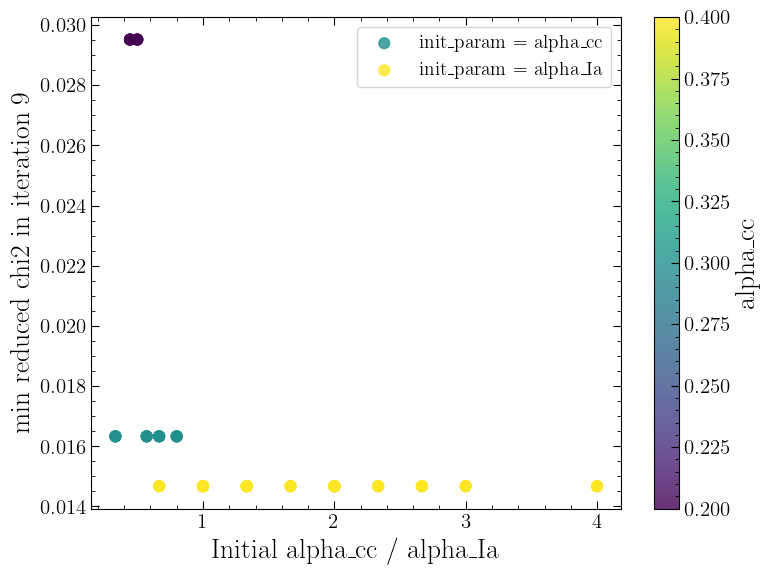

In [43]:
plt.figure(figsize=(8, 6))

vmin = min(
    df_summary_init_param_alpha_cc["alpha_cc"].min(),
    df_summary_init_param_alpha_Ia["alpha_cc"].min()
)
vmax = max(
    df_summary_init_param_alpha_cc["alpha_cc"].max(),
    df_summary_init_param_alpha_Ia["alpha_cc"].max()
)

s1 = plt.scatter(
    df_summary_init_param_alpha_cc["init_value"] / alpha_Ia_def,
    df_summary_init_param_alpha_cc["reduced_chi2"],
    c=df_summary_init_param_alpha_cc["alpha_cc"],
    cmap="viridis",
    vmin=vmin,
    vmax=vmax,
    s=60,
    alpha=0.8,
    label="init_param = alpha_cc"
)

s2 = plt.scatter(
    alpha_cc_def / df_summary_init_param_alpha_Ia["init_value"],
    df_summary_init_param_alpha_Ia["reduced_chi2"],
    c=df_summary_init_param_alpha_Ia["alpha_cc"],
    cmap="viridis",
    vmin=vmin,
    vmax=vmax,
    s=60,
    alpha=0.8,
    label="init_param = alpha_Ia"
)

cbar = plt.colorbar(s1, ax=plt.gca())
cbar.set_label("alpha_cc")

plt.xlabel("Initial alpha_cc / alpha_Ia")
plt.ylabel("min reduced chi2 in iteration 9")
plt.legend()
plt.tight_layout()

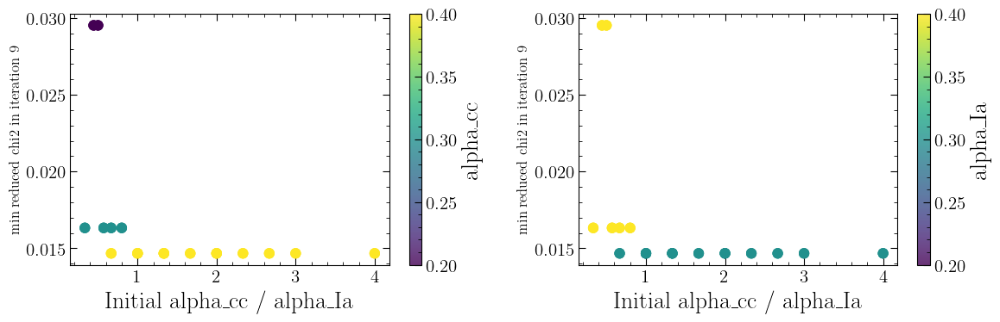

In [85]:
plt.figure(figsize=(12, 4))
plt.subplot(1,2,1)
vmin = min(
    df_summary_init_param_alpha_cc["alpha_cc"].min(),
    df_summary_init_param_alpha_Ia["alpha_cc"].min()
)
vmax = max(
    df_summary_init_param_alpha_cc["alpha_cc"].max(),
    df_summary_init_param_alpha_Ia["alpha_cc"].max()
)

s1 = plt.scatter(
    df_summary_init_param_alpha_cc["init_value"] / alpha_Ia_def,
    df_summary_init_param_alpha_cc["reduced_chi2"],
    c=df_summary_init_param_alpha_cc["alpha_cc"],
    cmap="viridis",
    vmin=vmin,
    vmax=vmax,
    s=60,
    alpha=0.8,
    label="init_param = alpha_cc"
)

s2 = plt.scatter(
    alpha_cc_def / df_summary_init_param_alpha_Ia["init_value"],
    df_summary_init_param_alpha_Ia["reduced_chi2"],
    c=df_summary_init_param_alpha_Ia["alpha_cc"],
    cmap="viridis",
    vmin=vmin,
    vmax=vmax,
    s=60,
    alpha=0.8,
    label="init_param = alpha_Ia"
)


cbar = plt.colorbar(s1, ax=plt.gca())
cbar.set_label("alpha_cc")
plt.xlabel("Initial alpha_cc / alpha_Ia")
plt.ylabel("min reduced chi2 in iteration 9", fontsize=12)

plt.subplot(1,2,2)
s1 = plt.scatter(
    df_summary_init_param_alpha_cc["init_value"] / alpha_Ia_def,
    df_summary_init_param_alpha_cc["reduced_chi2"],
    c=df_summary_init_param_alpha_cc["alpha_Ia"],
    cmap="viridis",
    vmin=vmin,
    vmax=vmax,
    s=60,
    alpha=0.8,
    label="init_param = alpha_cc"
)

s2 = plt.scatter(
    alpha_cc_def / df_summary_init_param_alpha_Ia["init_value"],
    df_summary_init_param_alpha_Ia["reduced_chi2"],
    c=df_summary_init_param_alpha_Ia["alpha_Ia"],
    cmap="viridis",
    vmin=vmin,
    vmax=vmax,
    s=60,
    alpha=0.8,
    label="init_param = alpha_Ia"
)
cbar = plt.colorbar(s1, ax=plt.gca())
cbar.set_label("alpha_Ia")

plt.xlabel("Initial alpha_cc / alpha_Ia")
plt.ylabel("min reduced chi2 in iteration 9", fontsize=12)
plt.tight_layout()

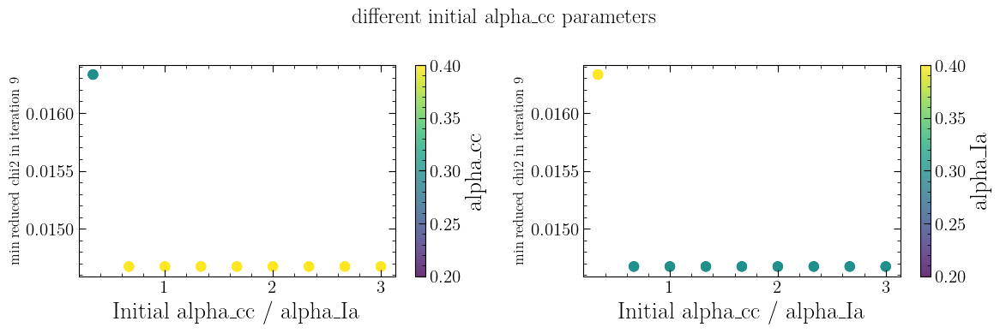

In [86]:
plt.figure(figsize=(12, 4))
plt.subplot(1,2,1)
vmin = min(
    df_summary_init_param_alpha_cc["alpha_cc"].min(),
    df_summary_init_param_alpha_Ia["alpha_cc"].min()
)
vmax = max(
    df_summary_init_param_alpha_cc["alpha_cc"].max(),
    df_summary_init_param_alpha_Ia["alpha_cc"].max()
)

s1 = plt.scatter(
    df_summary_init_param_alpha_cc["init_value"] / alpha_Ia_def,
    df_summary_init_param_alpha_cc["reduced_chi2"],
    c=df_summary_init_param_alpha_cc["alpha_cc"],
    cmap="viridis",
    vmin=vmin,
    vmax=vmax,
    s=60,
    alpha=0.8,
    label="init_param = alpha_cc"
)


cbar = plt.colorbar(s1, ax=plt.gca())
cbar.set_label("alpha_cc")
plt.xlabel("Initial alpha_cc / alpha_Ia")
plt.ylabel("min reduced chi2 in iteration 9", fontsize=12)

plt.subplot(1,2,2)
s1 = plt.scatter(
    df_summary_init_param_alpha_cc["init_value"] / alpha_Ia_def,
    df_summary_init_param_alpha_cc["reduced_chi2"],
    c=df_summary_init_param_alpha_cc["alpha_Ia"],
    cmap="viridis",
    vmin=vmin,
    vmax=vmax,
    s=60,
    alpha=0.8,
    label="init_param = alpha_cc"
)

cbar = plt.colorbar(s1, ax=plt.gca())
cbar.set_label("alpha_Ia")

plt.xlabel("Initial alpha_cc / alpha_Ia")
plt.ylabel("min reduced chi2 in iteration 9", fontsize=12)

plt.suptitle("different initial alpha_cc parameters")
plt.tight_layout()

/var/folders/g0/fl404sj151l2v9xcdkjz9fq80000gn/T/ipykernel_34447/4173819792.py:25: UserWarning: Adding colorbar to a different Figure <Figure size 1200x400 with 4 Axes> than <Figure size 1200x400 with 2 Axes> which fig.colorbar is called on.
  cbar = plt.colorbar(s1, ax=plt.gca())
/var/folders/g0/fl404sj151l2v9xcdkjz9fq80000gn/T/ipykernel_34447/4173819792.py:43: UserWarning: Adding colorbar to a different Figure <Figure size 1200x400 with 4 Axes> than <Figure size 1200x400 with 4 Axes> which fig.colorbar is called on.
  cbar = plt.colorbar(s1, ax=plt.gca())


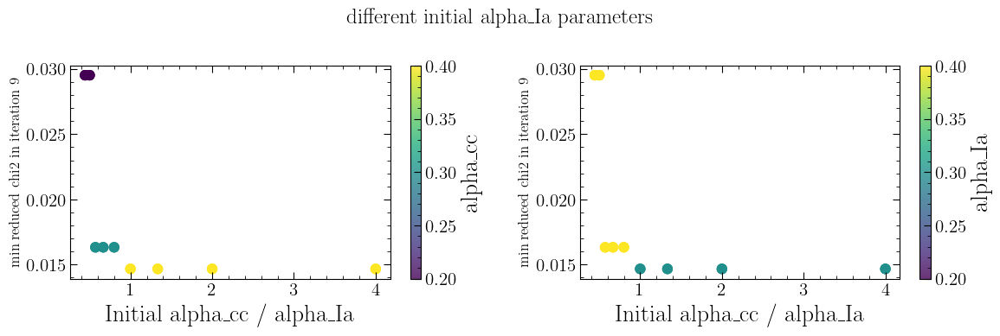

In [87]:
plt.figure(figsize=(12, 4))
plt.subplot(1,2,1)
vmin = min(
    df_summary_init_param_alpha_cc["alpha_cc"].min(),
    df_summary_init_param_alpha_Ia["alpha_cc"].min()
)
vmax = max(
    df_summary_init_param_alpha_cc["alpha_cc"].max(),
    df_summary_init_param_alpha_Ia["alpha_cc"].max()
)

s2 = plt.scatter(
    alpha_cc_def / df_summary_init_param_alpha_Ia["init_value"],
    df_summary_init_param_alpha_Ia["reduced_chi2"],
    c=df_summary_init_param_alpha_Ia["alpha_cc"],
    cmap="viridis",
    vmin=vmin,
    vmax=vmax,
    s=60,
    alpha=0.8,
    label="init_param = alpha_Ia"
)


cbar = plt.colorbar(s1, ax=plt.gca())
cbar.set_label("alpha_cc")
plt.xlabel("Initial alpha_cc / alpha_Ia")
plt.ylabel("min reduced chi2 in iteration 9", fontsize=12)

plt.subplot(1,2,2)
s2 = plt.scatter(
    alpha_cc_def / df_summary_init_param_alpha_Ia["init_value"],
    df_summary_init_param_alpha_Ia["reduced_chi2"],
    c=df_summary_init_param_alpha_Ia["alpha_Ia"],
    cmap="viridis",
    vmin=vmin,
    vmax=vmax,
    s=60,
    alpha=0.8,
    label="init_param = alpha_Ia"
)

cbar = plt.colorbar(s1, ax=plt.gca())
cbar.set_label("alpha_Ia")

plt.xlabel("Initial alpha_cc / alpha_Ia")
plt.ylabel("min reduced chi2 in iteration 9", fontsize=12)

plt.suptitle("different initial alpha_Ia parameters")
plt.tight_layout()

In [91]:
min_chi2 = np.min(df_summary_chi2_best['reduced_chi2'])
min_chi2_row = df_summary_chi2_best[df_summary_chi2_best['reduced_chi2'] == min_chi2]
min_chi2_row

,source_csv,file,alpha_cc,alpha_Ia,g_cc,g_ratio,Upsilon,Chi_2_sum,reduced_chi2,n_points,init_param,init_value,opt_param,best_or_not,color,color_alpha_cc
361,models_no_mask/g_cc_init_0.1/chi_2_results_alp...,models_no_mask/g_cc_init_0.1/alpha_Ia_iter9_0....,0.3,0.2,0.3,2.4,1,1.828501,0.013445,136,g_cc,0.1,alpha_Ia,1,,cornflowerblue
364,models_no_mask/g_cc_init_0.1/chi_2_results_alp...,models_no_mask/g_cc_init_0.1/alpha_cc_iter9_0....,0.3,0.2,0.3,2.4,1,1.828501,0.013445,136,g_cc,0.1,alpha_cc,1,,cornflowerblue
370,models_no_mask/g_cc_init_0.1/chi_2_results_g_c...,models_no_mask/g_cc_init_0.1/g_cc_iter9_0.3000...,0.3,0.2,0.3,2.4,1,1.828501,0.013445,136,g_cc,0.1,g_cc,1,,cornflowerblue
373,models_no_mask/g_cc_init_0.1/chi_2_results_g_r...,models_no_mask/g_cc_init_0.1/g_ratio_iter9_2.4...,0.3,0.2,0.3,2.4,1,1.828501,0.013445,136,g_cc,0.1,g_ratio,1,,cornflowerblue
380,models_no_mask/g_cc_init_0.2/chi_2_results_alp...,models_no_mask/g_cc_init_0.2/alpha_Ia_iter9_0....,0.3,0.2,0.3,2.4,1,1.828501,0.013445,136,g_cc,0.2,alpha_Ia,1,,cornflowerblue
383,models_no_mask/g_cc_init_0.2/chi_2_results_alp...,models_no_mask/g_cc_init_0.2/alpha_cc_iter9_0....,0.3,0.2,0.3,2.4,1,1.828501,0.013445,136,g_cc,0.2,alpha_cc,1,,cornflowerblue
389,models_no_mask/g_cc_init_0.2/chi_2_results_g_c...,models_no_mask/g_cc_init_0.2/g_cc_iter9_0.3000...,0.3,0.2,0.3,2.4,1,1.828501,0.013445,136,g_cc,0.2,g_cc,1,,cornflowerblue
392,models_no_mask/g_cc_init_0.2/chi_2_results_g_r...,models_no_mask/g_cc_init_0.2/g_ratio_iter9_2.4...,0.3,0.2,0.3,2.4,1,1.828501,0.013445,136,g_cc,0.2,g_ratio,1,,cornflowerblue
399,models_no_mask/g_cc_init_0.3/chi_2_results_alp...,models_no_mask/g_cc_init_0.30000000000000004/a...,0.3,0.2,0.3,2.4,1,1.828501,0.013445,136,g_cc,0.3,alpha_Ia,1,,cornflowerblue
402,models_no_mask/g_cc_init_0.3/chi_2_results_alp...,models_no_mask/g_cc_init_0.30000000000000004/a...,0.3,0.2,0.3,2.4,1,1.828501,0.013445,136,g_cc,0.3,alpha_cc,1,,cornflowerblue


In [107]:
# 1. Filter out the minimum value
filtered_df = df_summary_chi2_best[df_summary_chi2_best['reduced_chi2'] > min_chi2]

# 2. Find the minimum of the remaining rows
second_min_chi2 = filtered_df['reduced_chi2'].min()
second_best_row = filtered_df[filtered_df['reduced_chi2'] == second_min_chi2]
second_best_row

,source_csv,file,alpha_cc,alpha_Ia,g_cc,g_ratio,Upsilon,Chi_2_sum,reduced_chi2,n_points,init_param,init_value,opt_param,best_or_not,color,color_alpha_cc
2,models_no_mask/alpha_Ia_init_0.1/chi_2_results...,models_no_mask/alpha_Ia_init_0.1/alpha_Ia_iter...,0.4,0.3,0.4,1.7,1,1.995763,0.014675,136,alpha_Ia,0.1,alpha_Ia,1,,orange
8,models_no_mask/alpha_Ia_init_0.1/chi_2_results...,models_no_mask/alpha_Ia_init_0.1/alpha_cc_iter...,0.4,0.3,0.4,1.7,1,1.995763,0.014675,136,alpha_Ia,0.1,alpha_cc,1,,orange
10,models_no_mask/alpha_Ia_init_0.1/chi_2_results...,models_no_mask/alpha_Ia_init_0.1/g_cc_iter9_0....,0.4,0.3,0.4,1.7,1,1.995763,0.014675,136,alpha_Ia,0.1,g_cc,1,,orange
17,models_no_mask/alpha_Ia_init_0.1/chi_2_results...,models_no_mask/alpha_Ia_init_0.1/g_ratio_iter9...,0.4,0.3,0.4,1.7,1,1.995763,0.014675,136,alpha_Ia,0.1,g_ratio,1,,orange
22,models_no_mask/alpha_Ia_init_0.2/chi_2_results...,models_no_mask/alpha_Ia_init_0.2/alpha_Ia_iter...,0.4,0.3,0.4,1.7,1,1.995763,0.014675,136,alpha_Ia,0.2,alpha_Ia,1,,orange
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
630,models_no_mask/g_ratio_init_1.9/chi_2_results_...,models_no_mask/g_ratio_init_1.9/g_ratio_iter9_...,0.4,0.3,0.4,1.7,1,1.995763,0.014675,136,g_ratio,1.9,g_ratio,1,,orange
653,models_no_mask/g_ratio_init_2.1/chi_2_results_...,models_no_mask/g_ratio_init_2.1/alpha_Ia_iter9...,0.4,0.3,0.4,1.7,1,1.995763,0.014675,136,g_ratio,2.1,alpha_Ia,1,,orange
659,models_no_mask/g_ratio_init_2.1/chi_2_results_...,models_no_mask/g_ratio_init_2.1/alpha_cc_iter9...,0.4,0.3,0.4,1.7,1,1.995763,0.014675,136,g_ratio,2.1,alpha_cc,1,,orange
661,models_no_mask/g_ratio_init_2.1/chi_2_results_...,models_no_mask/g_ratio_init_2.1/g_cc_iter9_0.4...,0.4,0.3,0.4,1.7,1,1.995763,0.014675,136,g_ratio,2.1,g_cc,1,,orange


In [109]:
second_best_row.to_csv("second_best_rows.csv")

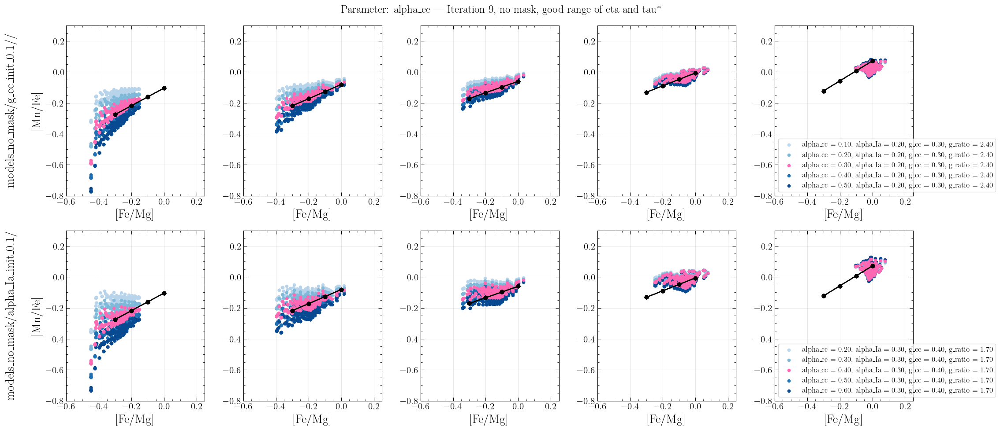

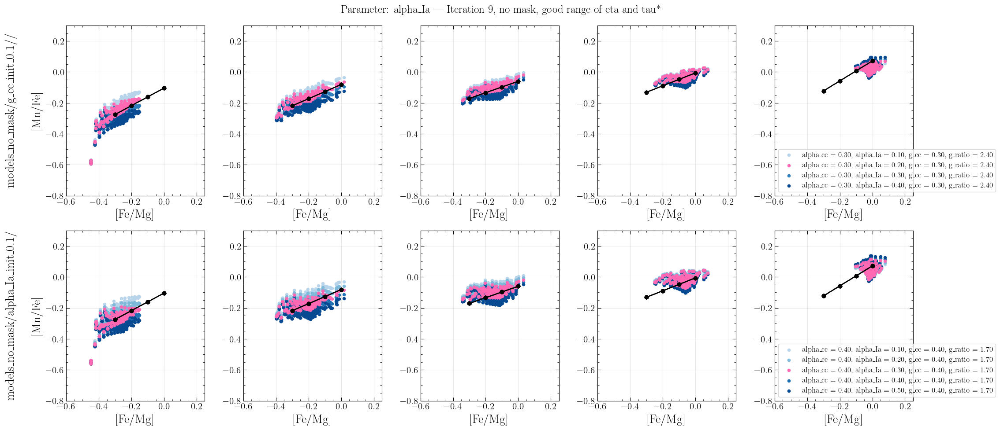

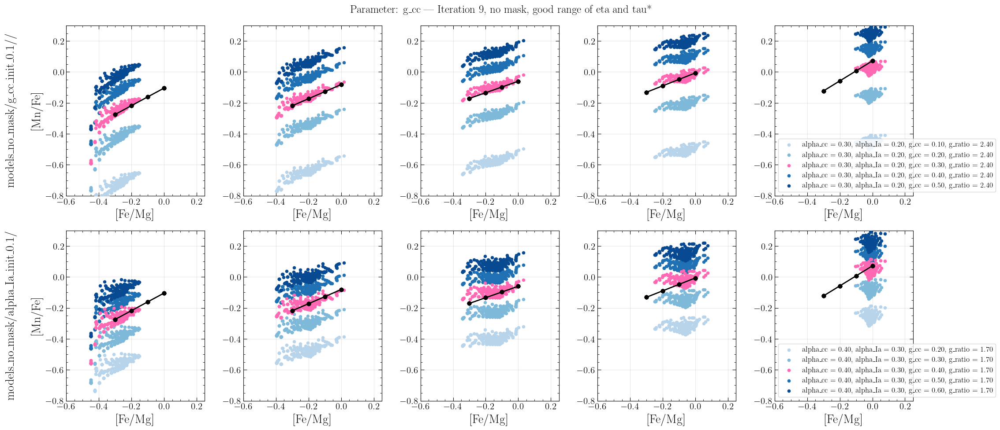

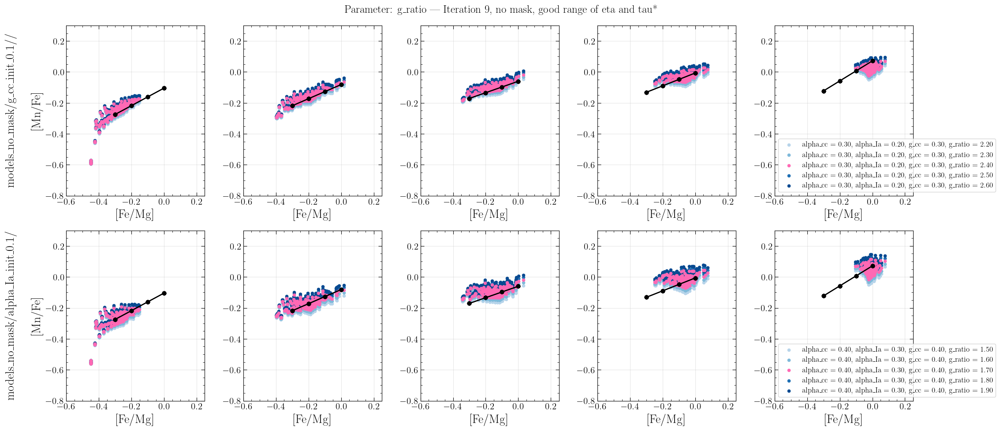

In [110]:
folders = [
    "models_no_mask/g_cc_init_0.1//",
    "models_no_mask/alpha_Ia_init_0.1/",
] 

plot_iteration_models(
    folders=folders,
    data=data,
    fe_mg_centers=fe_mg_centers,
    iter_num=9,
)

In [106]:
alpha_Ia_def

0.3